<a href="https://colab.research.google.com/github/LeoLiding/Livingness_structure_by_CVmethods/blob/main/The_Recursive_Approach_Head_tail_Breaks4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# 读取灰度图像
def read_grayscale_image(image_path):
    return cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 计算平均灰度值
def calculate_average_gray_value(image, mask=None):
    if mask is None:
        # For the first iteration, calculate the average gray value of the entire image
        return np.mean(image)
    else:
        # For subsequent iterations, calculate the average gray value using the mask
        # Convert mask to 8-bit unsigned integer
        mask = mask.astype(np.uint8)
        masked_image = cv2.bitwise_and(image, image, mask=mask)
        masked_pixels = np.count_nonzero(mask)
        if masked_pixels == 0:
            return 0
        return np.sum(masked_image) / masked_pixels

# 区分图形和地面
def distinguish_figure_ground(image, average_gray_value):
    height, width = image.shape
    figure = np.zeros_like(image, dtype=np.uint8)
    ground = np.zeros_like(image, dtype=np.uint8)

    dark_pixels_count = 0
    bright_pixels_count = 0

    for y in range(height):
        for x in range(width):
            pixel_value = image[y, x]
            if pixel_value > average_gray_value:
                bright_pixels_count += 1
                ground[y, x] = pixel_value
            else:
                dark_pixels_count += 1
                figure[y, x] = pixel_value

    # Calculate the percentage of dark and bright pixels
    total_pixels = height * width
    dark_pixels_percentage = dark_pixels_count / total_pixels
    bright_pixels_percentage = bright_pixels_count / total_pixels

    # Determine figure and ground based on the percentages
    if dark_pixels_percentage > bright_pixels_percentage:
        figure, ground = ground, figure

    return figure, ground

# 二值化图像
def binarize_image(image):
    _, binary_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY)
    return binary_image

# 矢量化子结构
def vectorize_substructure(binary_image):
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours


# 迭代递归处理图像
def recursive_image_processing(image, max_iterations=10, first_iteration_no_mask=False):
    processed_images = []
    processed_images.append(image)

    for i in range(1, max_iterations + 1):
        # Get the substructure region from the previous iteration
        substructure_region = processed_images[i - 1]

        # Create a mask for the substructure region
        if i == 1 and first_iteration_no_mask:
            mask = None
        else:
            mask = np.where(substructure_region > 0, 1, 0)

        # Calculate the average gray value within the substructure region
        average_gray_value = calculate_average_gray_value(image, mask)

        # 区分图形和地面 based on the substructure region
        figure, ground = distinguish_figure_ground(substructure_region, average_gray_value)

        # 二值化图像
        binary_image = binarize_image(figure)  # Use figure as it contains the structures

        # 矢量化子结构
        substructures = vectorize_substructure(binary_image)

        # Update the substructure region for the next iteration
        new_image = np.zeros_like(image, dtype=np.uint8)  # Initialize new_image with all zeros
        for contour in substructures:
            x, y, w, h = cv2.boundingRect(contour)
            substructure_region = figure[y:y+h, x:x+w]  # Extract region from the figure image

            # Update the corresponding region in new_image
            new_image[y:y+h, x:x+w] = substructure_region

        # 存储当前迭代的结果
        processed_images.append(new_image)

    return processed_images


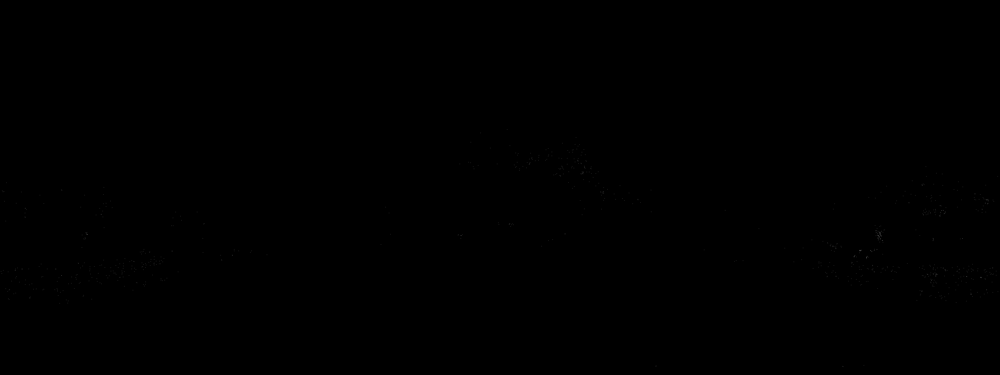

Iteration 1 - Inverted Binary Image (First Threshold)


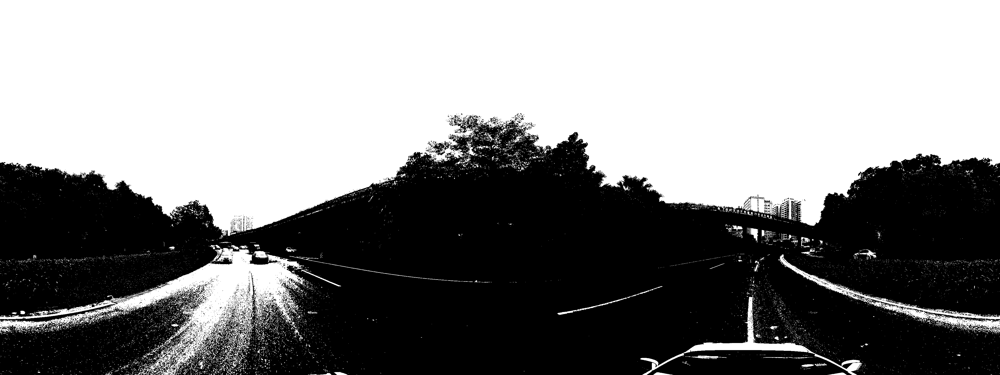

Iteration 2 - Inverted Binary Image (First Threshold)


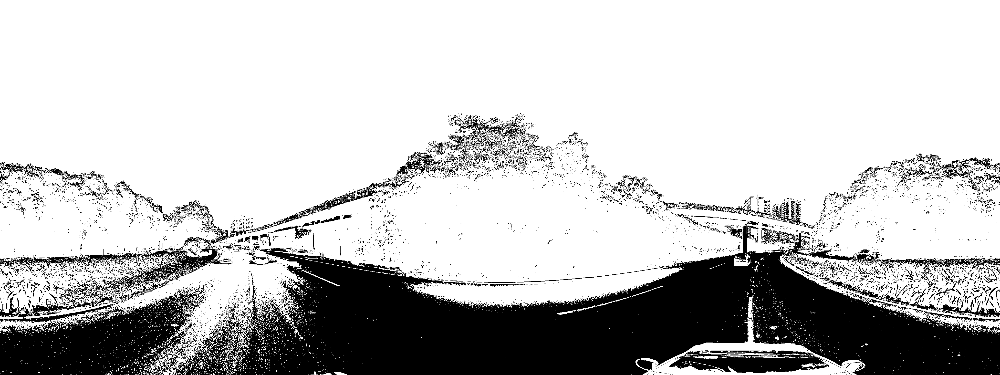

Iteration 3 - Inverted Binary Image (First Threshold)


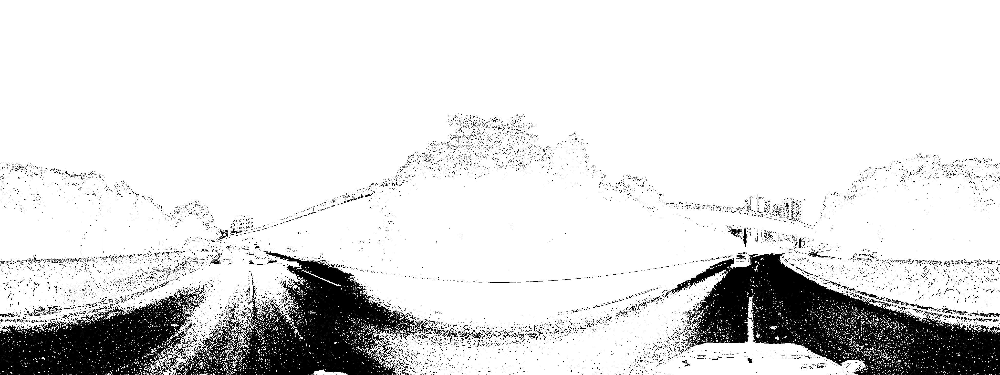

Iteration 4 - Inverted Binary Image (First Threshold)


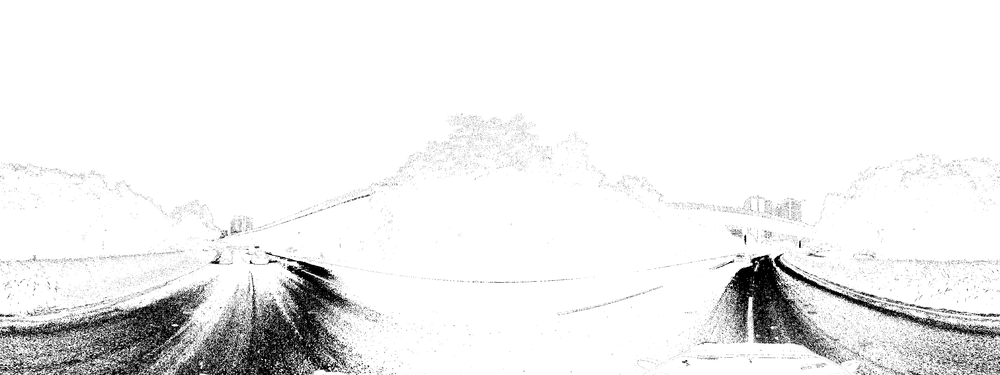

Iteration 5 - Inverted Binary Image (First Threshold)


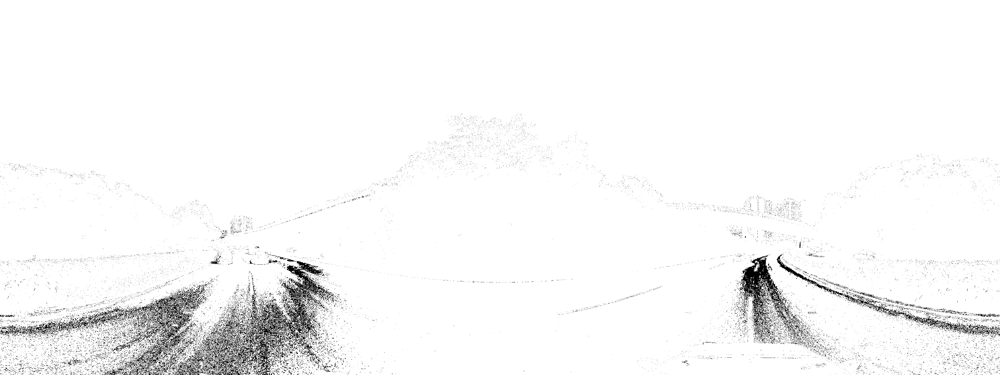

Iteration 6 - Inverted Binary Image (First Threshold)


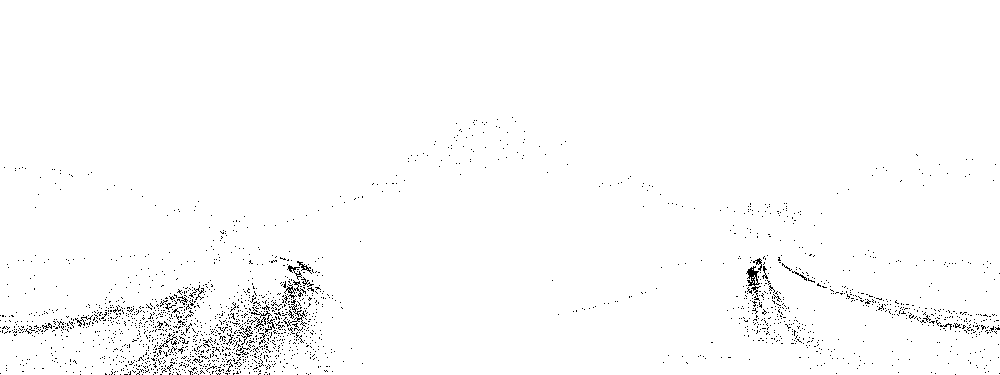

Iteration 7 - Inverted Binary Image (First Threshold)


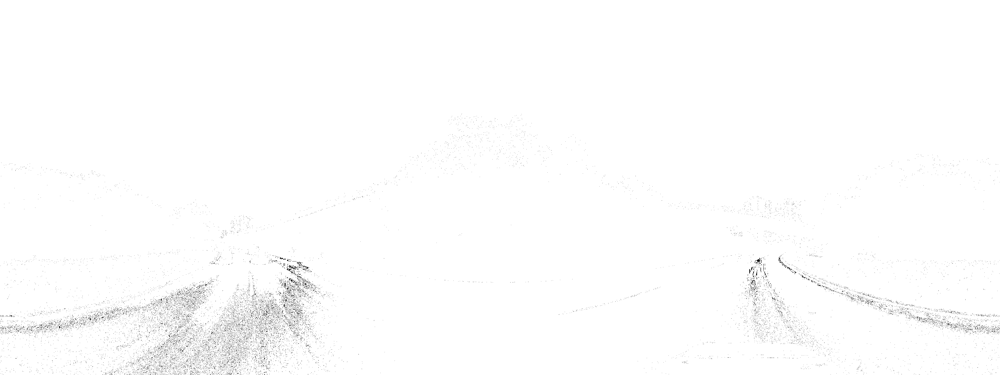

Iteration 8 - Inverted Binary Image (First Threshold)


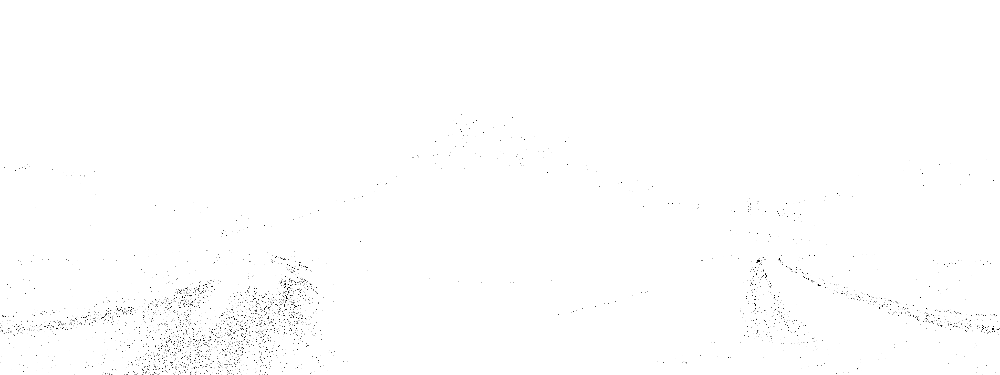

Iteration 9 - Inverted Binary Image (First Threshold)


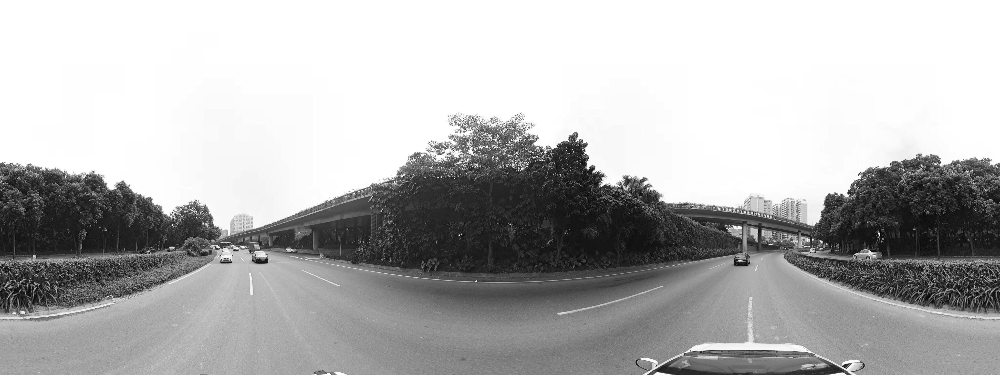

Original Image


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# ... (previous functions remain the same) ...

# 主程序
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "2.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为10
    max_iterations = 8
    # 迭代递归处理图像
    processed_images = recursive_image_processing(image, max_iterations)

    # 打印原始图像和每次迭代得到的子结构的二值化图像
    for i, processed_image in enumerate(processed_images):
        # 第一次二值化处理
        _, binary_image = cv2.threshold(processed_image, 0, 255, cv2.THRESH_BINARY)

        # 反转二值化图像
        inverted_binary_image = cv2.bitwise_not(binary_image)

        # 打印反转后的图像
        cv2_imshow(inverted_binary_image)
        print(f"Iteration {i + 1} - Inverted Binary Image (First Threshold)")

    cv2_imshow(image)
    print("Original Image")

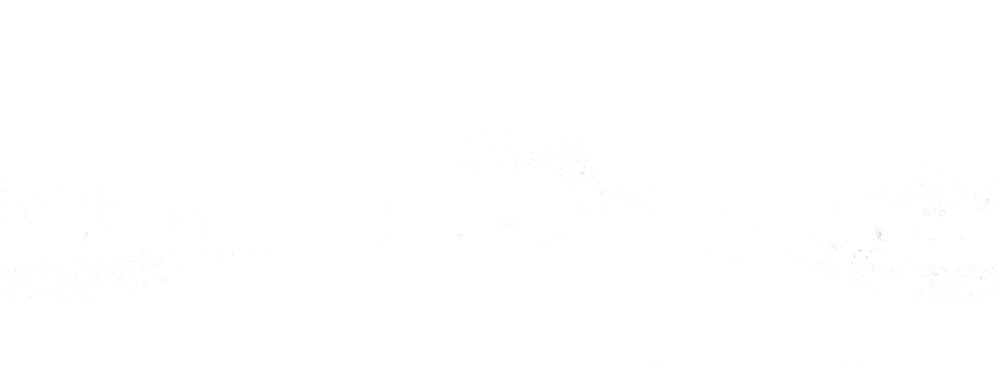

Iteration 1 - Binary Image (First Threshold)


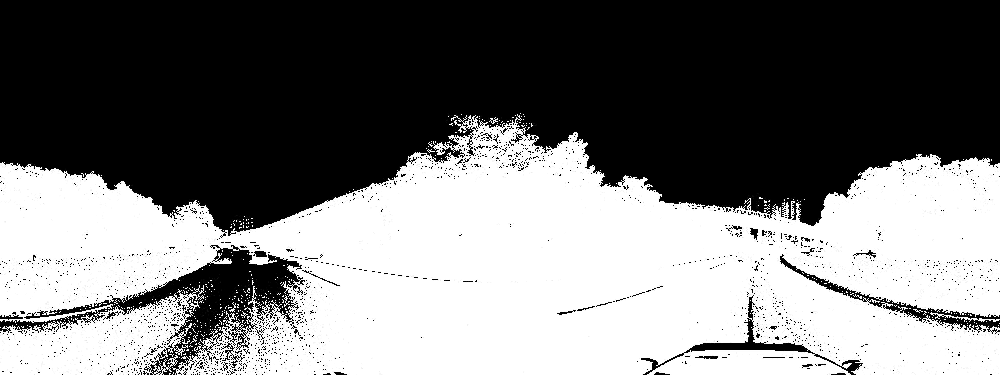

Iteration 2 - Binary Image (First Threshold)


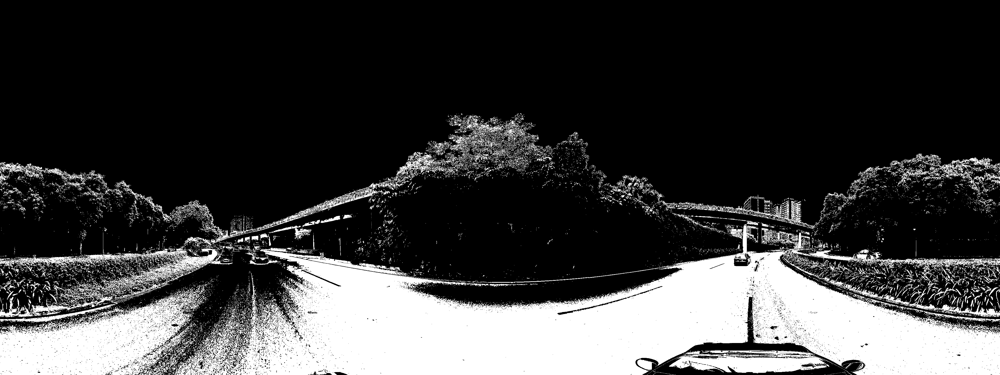

Iteration 3 - Binary Image (First Threshold)


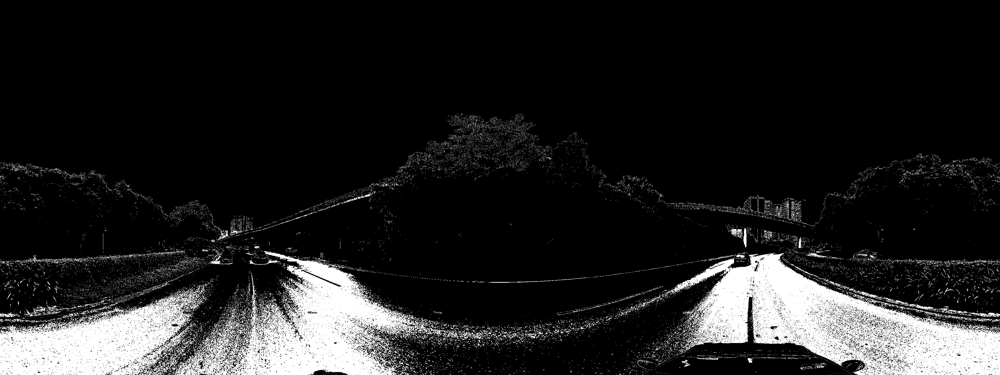

Iteration 4 - Binary Image (First Threshold)


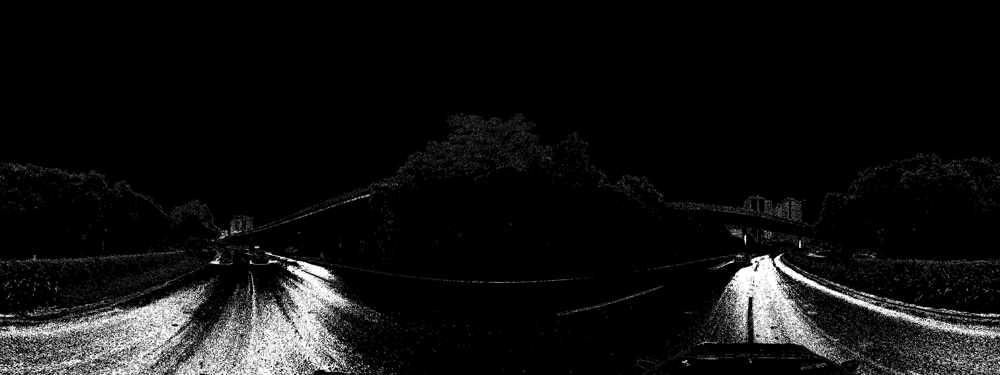

Iteration 5 - Binary Image (First Threshold)


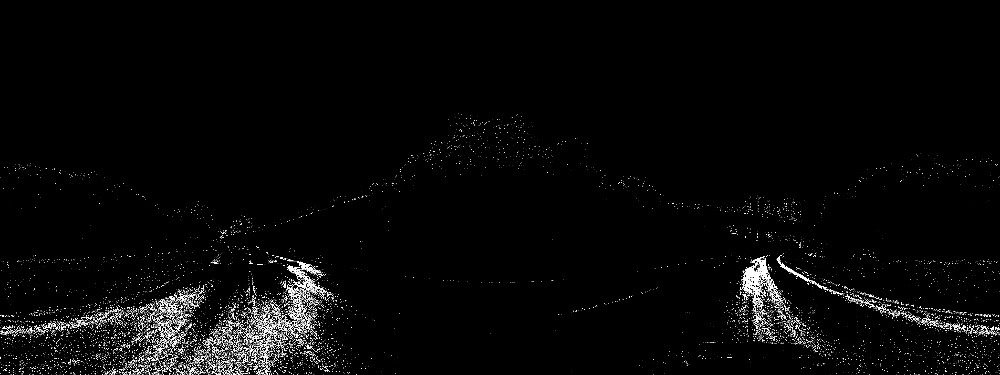

Iteration 6 - Binary Image (First Threshold)


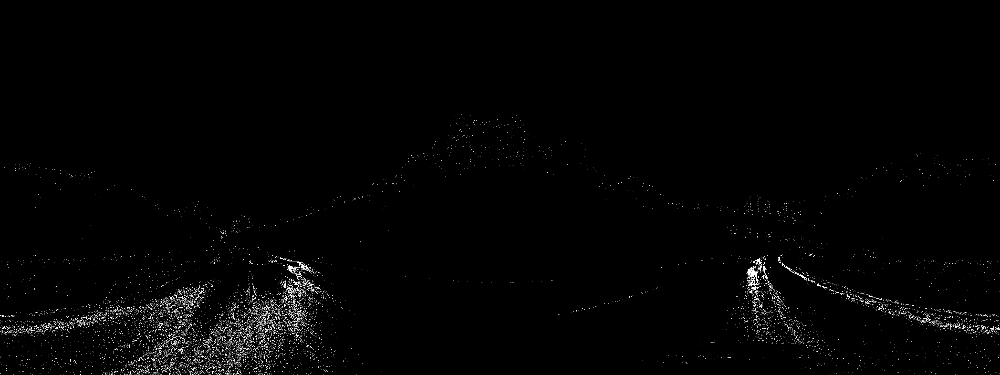

Iteration 7 - Binary Image (First Threshold)


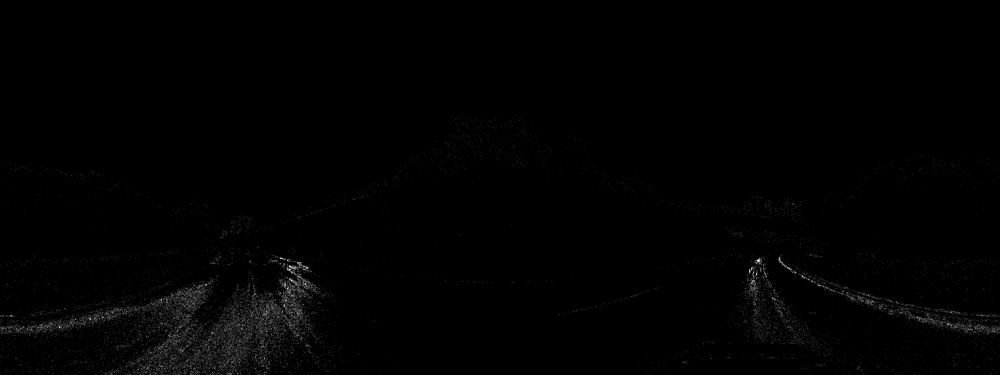

Iteration 8 - Binary Image (First Threshold)


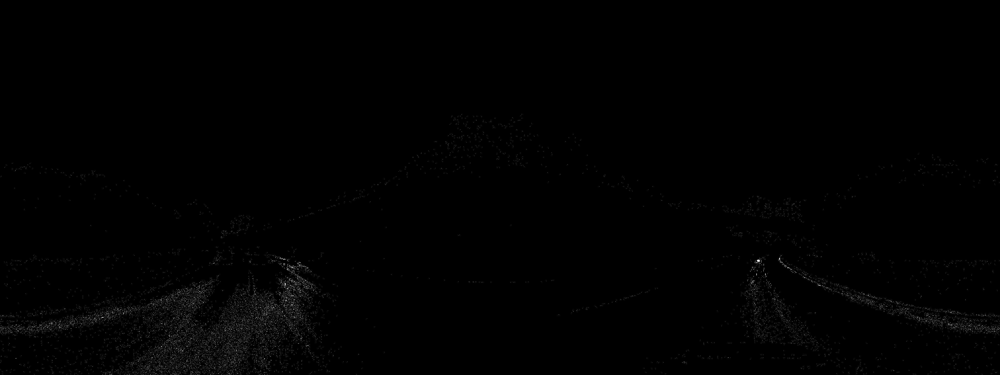

Iteration 9 - Binary Image (First Threshold)


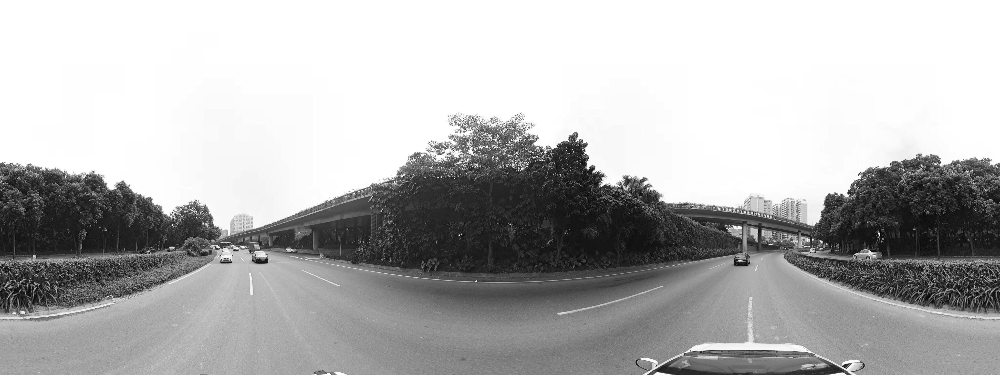

Original Image


In [ ]:
# 主程序
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "2.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为10
    max_iterations = 8
    # 迭代递归处理图像
    processed_images = recursive_image_processing(image, max_iterations)

    # 打印原始图像和每次迭代得到的子结构的二值化图像
    for i, processed_image in enumerate(processed_images):
        # 第一次二值化处理
        _, binary_image = cv2.threshold(processed_image, 0, 255, cv2.THRESH_BINARY)

        # 打印第一次二值化处理后的图像
        cv2_imshow(binary_image)
        print(f"Iteration {i + 1} - Binary Image (First Threshold)")

    cv2_imshow(image)
    print("Original Image")

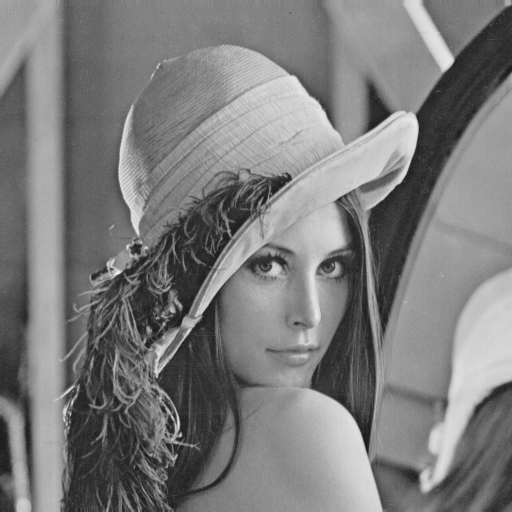

Original Image


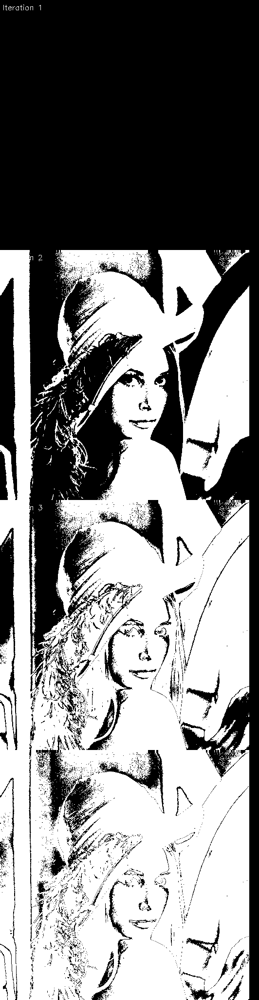

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# ... (previous functions remain the same) ...

# 主程序
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "lena.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为10
    max_iterations = 3
    # 迭代递归处理图像
    processed_images = recursive_image_processing(image, max_iterations)

    # 创建一张新的图像，用于可视化反转后的二值化图像和子结构
    spacing = 20  # Set the spacing between images
    rows = []  # List to store rows of images

    # 打印原始图像
    cv2_imshow(image)
    print("Original Image")

    # 打印每次迭代得到的子结构的反转后的二值化图像
    for i, processed_image in enumerate(processed_images):
        # 第一次二值化处理
        _, binary_image = cv2.threshold(processed_image, 0, 255, cv2.THRESH_BINARY)

        # 反转二值化图像
        inverted_binary_image = cv2.bitwise_not(binary_image)

        # 保存反转后的图像和文字信息
        row = np.hstack((inverted_binary_image, np.zeros((inverted_binary_image.shape[0], spacing))))
        row_with_text = cv2.putText(row, f"Iteration {i + 1}", (5, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        rows.append(row_with_text)

    # 将所有图像组合成一个大图并显示
    combined_horizontal = np.vstack(rows)
    cv2_imshow(combined_horizontal)


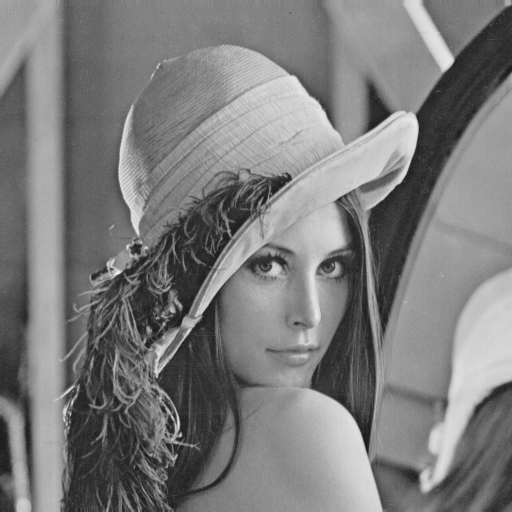

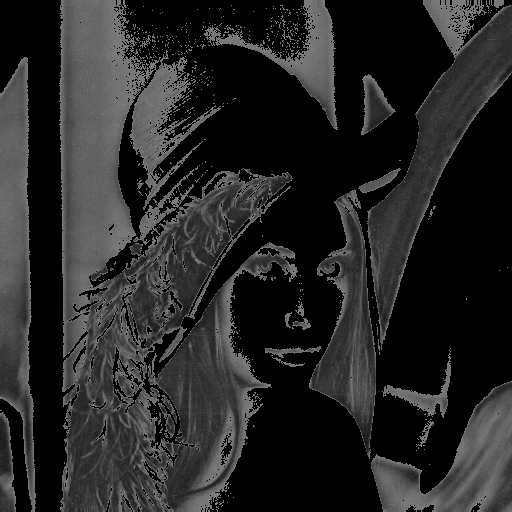

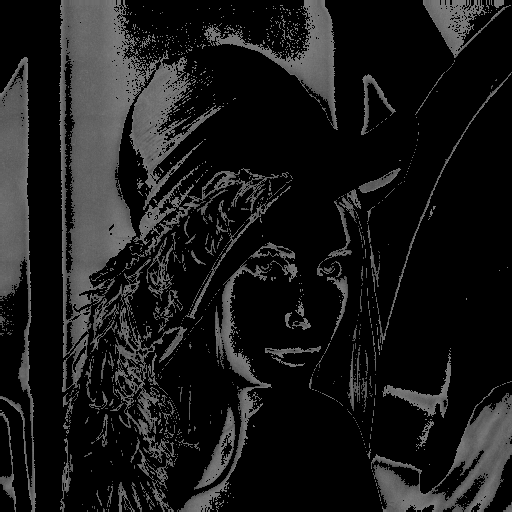

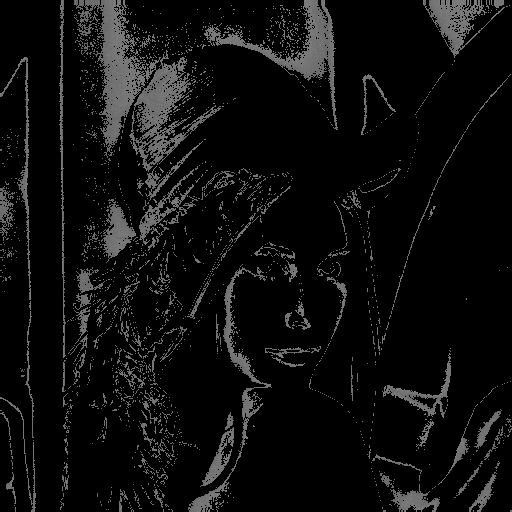

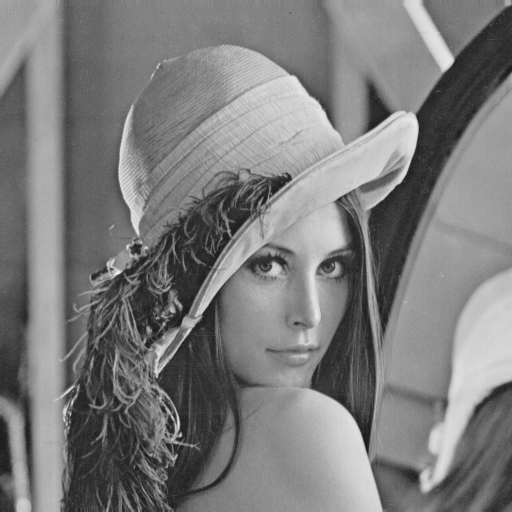

In [ ]:
# 主程序
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "lena.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为10
    max_iterations = 3
    # 迭代递归处理图像
    processed_images = recursive_image_processing(image, max_iterations)

    # 打印原始图像和每次迭代得到的子结构的二值化图像
    for i, processed_image in enumerate(processed_images):
        cv2_imshow(processed_image)

    cv2_imshow(image)

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# 读取灰度图像
def read_grayscale_image(image_path):
    return cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 计算平均灰度值
def calculate_average_gray_value(image, mask=None):
    if mask is None:
        # For the first iteration, calculate the average gray value of the entire image
        return np.mean(image)
    else:
        # For subsequent iterations, calculate the average gray value using the mask
        # Convert mask to 8-bit unsigned integer
        mask = mask.astype(np.uint8)
        masked_image = cv2.bitwise_and(image, image, mask=mask)
        masked_pixels = np.count_nonzero(mask)
        if masked_pixels == 0:
            return 0
        return np.sum(masked_image) / masked_pixels

# 区分图形和地面
def distinguish_figure_ground(image, average_gray_value):
    height, width = image.shape
    figure = np.zeros_like(image, dtype=np.uint8)
    ground = np.zeros_like(image, dtype=np.uint8)

    dark_pixels_count = 0
    bright_pixels_count = 0

    for y in range(height):
        for x in range(width):
            pixel_value = image[y, x]
            if pixel_value > average_gray_value:
                bright_pixels_count += 1
                ground[y, x] = pixel_value
            else:
                dark_pixels_count += 1
                figure[y, x] = pixel_value

    # Calculate the percentage of dark and bright pixels
    total_pixels = height * width
    dark_pixels_percentage = dark_pixels_count / total_pixels
    bright_pixels_percentage = bright_pixels_count / total_pixels

    # Determine figure and ground based on the percentages
    # Always use figure as binary_image for the first iteration
    if dark_pixels_percentage > bright_pixels_percentage:
        figure, ground = ground, figure

    return figure, ground


# 二值化图像
def binarize_image(image):
    _, binary_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY)
    return binary_image

# 矢量化子结构
def vectorize_substructure(binary_image):
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours


def recursive_image_processing(image, figure, max_iterations=10, first_iteration_no_mask=False):
    processed_images = []
    processed_images.append(image)
    center_points_list = []  # List to store center points for each iteration

    for i in range(1, max_iterations + 1):
        # Get the substructure region from the previous iteration
        substructure_region = processed_images[i - 1]

        # Create a mask for the substructure region
        if i == 1 and first_iteration_no_mask:
            mask = None
        else:
            mask = np.where(substructure_region > 0, 1, 0)

        # Calculate the average gray value within the substructure region
        average_gray_value = calculate_average_gray_value(image, mask)

        # 区分图形和地面 based on the substructure region
        figure, ground = distinguish_figure_ground(substructure_region, average_gray_value)

        # 二值化图像
        binary_image = binarize_image(figure)  # Use figure as it contains the structures

        # 矢量化子结构
        substructures = vectorize_substructure(binary_image)

        # Update the substructure region for the next iteration
        new_image = np.zeros_like(image, dtype=np.uint8)  # Initialize new_image with all zeros
        center_points = []  # List to store center points for this iteration
        for contour in substructures:
            x, y, w, h = cv2.boundingRect(contour)
            substructure_region = figure[y:y+h, x:x+w]  # Extract region from the figure image

            # Update the corresponding region in new_image
            new_image[y:y+h, x:x+w] = substructure_region

            # Calculate the centroid of the contour
            M = cv2.moments(contour)
            if M["m00"] != 0:
                cX = int(M["m10"] / M["m00"])
                cY = int(M["m01"] / M["m00"])
            else:
                cX, cY = -1, -1
            center_points.append((cX, cY))  # Save center point for this contour

        center_points_list.append(center_points)  # Save center points for this iteration

        # 存储当前迭代的结果
        processed_images.append(new_image)

    return processed_images, center_points_list






In [ ]:
# 主程序
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "1.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为10
    max_iterations = 8
    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, image, max_iterations)

    # 打印中心点可视化图像
    for i, center_points in enumerate(center_points_list):
        center_points_image = np.zeros_like(image, dtype=np.uint8)
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                cv2.circle(center_points_image, (cX, cY), 2, 255, -1)  # Draw a white circle at the center point

        # Invert the colors of the center points visualization
        center_points_image = cv2.bitwise_not(center_points_image)

        # Display the center points visualization
        cv2_imshow(center_points_image)
        print(f"Iteration {i + 1} - Center Points Visualization")

In [ ]:
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "1.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为10
    max_iterations = 8
    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, image, max_iterations)

    # 打印中心点可视化图像和中心点数量
    for i, center_points in enumerate(center_points_list):
        center_points_image = np.zeros_like(image, dtype=np.uint8)
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                cv2.circle(center_points_image, (cX, cY), 5, 255, -1)  # Draw a white circle at the center point

        # Invert the colors of the center points visualization
        center_points_image = cv2.bitwise_not(center_points_image)

        # Count the number of center points
        num_center_points = len(center_points)

        # Display the center points visualization
        cv2_imshow(center_points_image)
        print(f"Iteration {i + 1} - Center Points Visualization")
        print(f"Number of center points: {num_center_points}")

In [ ]:
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "lena.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为10
    max_iterations = 7
    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, image, max_iterations)

    # Create a blank image to display all center points together
    all_center_points_image = np.zeros_like(image, dtype=np.uint8)

    # 打印中心点可视化图像和中心点数量
    for i, center_points in enumerate(center_points_list):
        center_points_image = np.zeros_like(image, dtype=np.uint8)
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                cv2.circle(center_points_image, (cX, cY), 5, 255, -1)  # Draw a white circle at the center point

        # Invert the colors of the center points visualization
        center_points_image = cv2.bitwise_not(center_points_image)

        # Count the number of center points
        num_center_points = len(center_points)

        # Display the center points visualization
        cv2_imshow(center_points_image)
        print(f"Iteration {i + 1} - Center Points Visualization")
        print(f"Number of center points: {num_center_points}")

        # Add the current center points visualization to the all_center_points_image
        all_center_points_image = cv2.add(all_center_points_image, center_points_image)

    # Display the final image with all center points
    cv2_imshow(all_center_points_image)


In [ ]:
# 矢量化子结构 (Modified with dilation)
def vectorize_substructure(binary_image):
    kernel = np.ones((3, 3), np.uint8)
    dilated_image = cv2.dilate(binary_image, kernel, iterations=1)
    contours, _ = cv2.findContours(dilated_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours

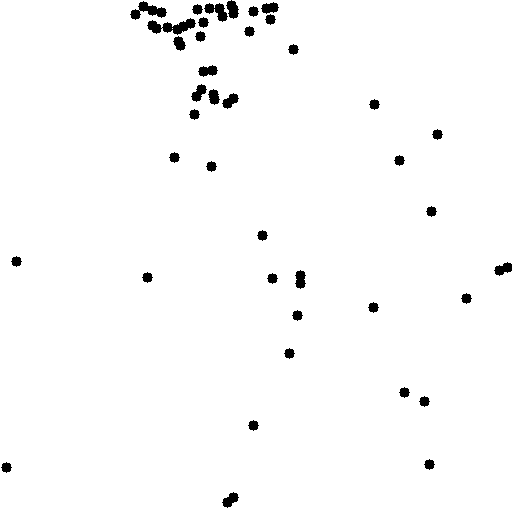

Iteration 1 - Center Points Visualization
Number of center points: 61


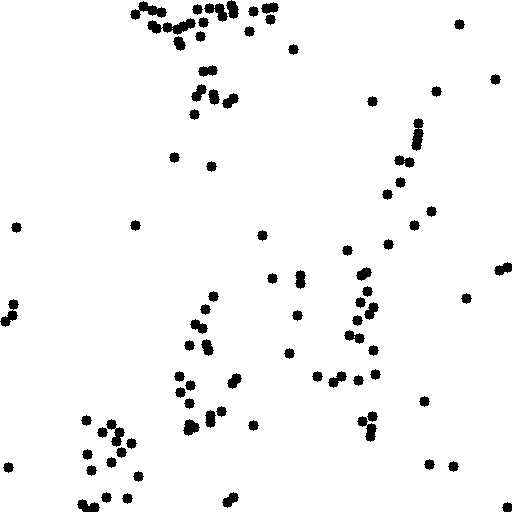

Iteration 2 - Center Points Visualization
Number of center points: 130


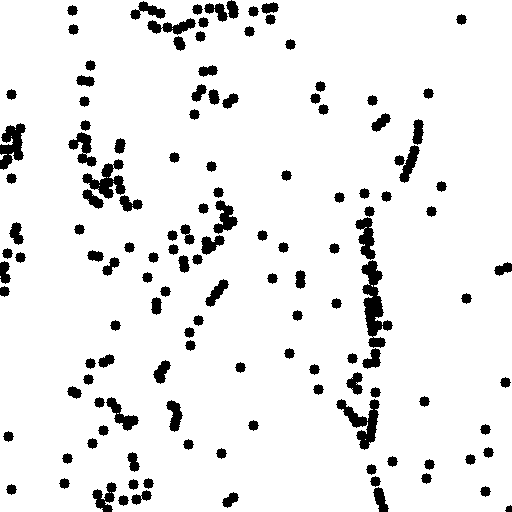

Iteration 3 - Center Points Visualization
Number of center points: 278


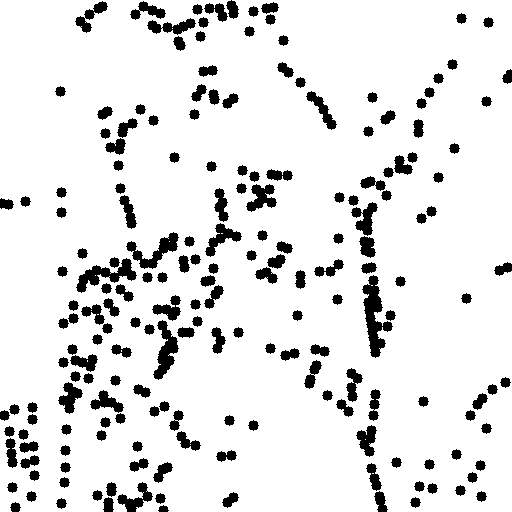

Iteration 4 - Center Points Visualization
Number of center points: 383


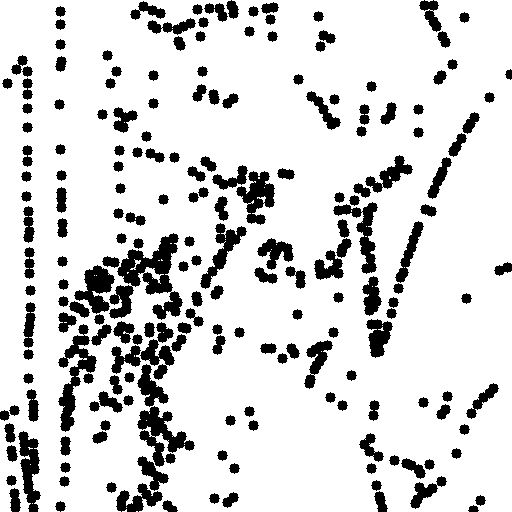

Iteration 5 - Center Points Visualization
Number of center points: 581


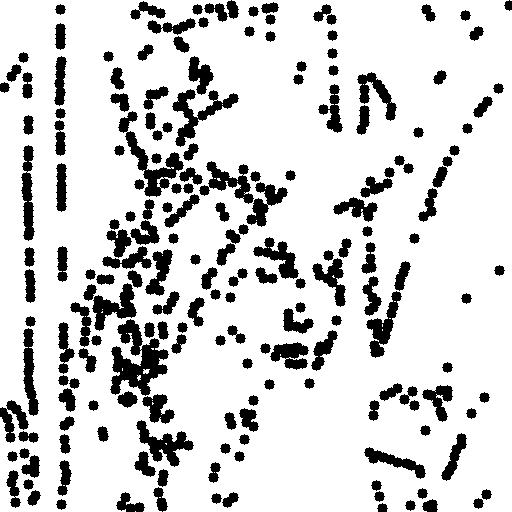

Iteration 6 - Center Points Visualization
Number of center points: 638


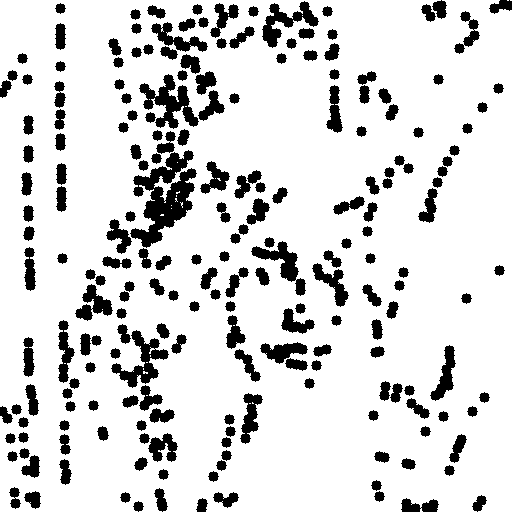

Iteration 7 - Center Points Visualization
Number of center points: 565


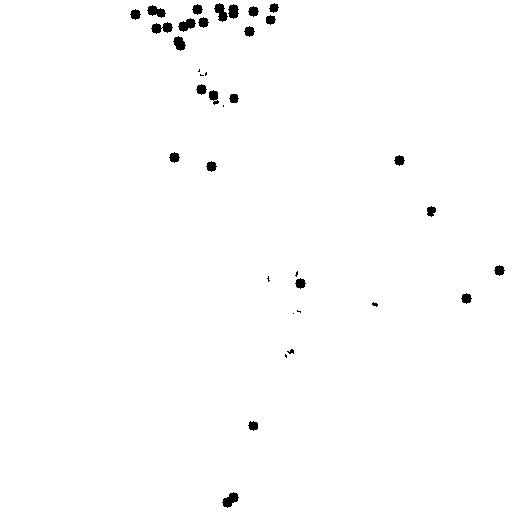

In [ ]:
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "lena.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为10
    max_iterations = 7
    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, image, max_iterations)

    # Create a blank image to display all center points together
    all_center_points_image = np.zeros_like(image, dtype=np.uint8)

    # 打印中心点可视化图像和中心点数量
    for i, center_points in enumerate(center_points_list):
        center_points_image = np.zeros_like(image, dtype=np.uint8)
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                cv2.circle(center_points_image, (cX, cY), 5, 255, -1)  # Draw a white circle at the center point

        # Invert the colors of the center points visualization
        center_points_image = cv2.bitwise_not(center_points_image)

        # Count the number of center points
        num_center_points = len(center_points)

        # Display the center points visualization
        cv2_imshow(center_points_image)
        print(f"Iteration {i + 1} - Center Points Visualization")
        print(f"Number of center points: {num_center_points}")

        # Add the current center points visualization to the all_center_points_image
        all_center_points_image = cv2.add(all_center_points_image, center_points_image)

    # Display the final image with all center points
    cv2_imshow(all_center_points_image)

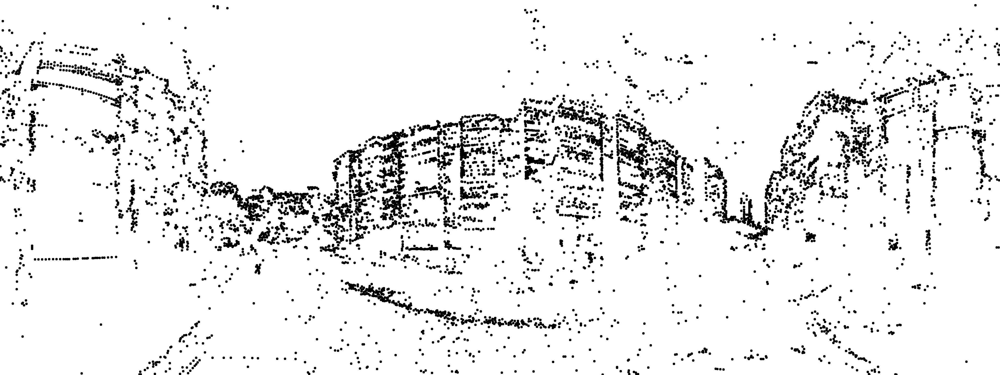

Final Image - Accumulated Center Points Visualization


In [ ]:
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "1.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为3
    max_iterations = 8
    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, image, max_iterations)

    # Create a blank image to accumulate all center points
    final_center_points_image = np.zeros_like(image, dtype=np.uint8)

    # Create a set to store unique center points
    unique_center_points = set()

    # Record and accumulate the center points from each iteration
    for i, center_points in enumerate(center_points_list):
        for cX, cY in center_points:
            if cX != -1 and cY != -1 and (cX, cY) not in unique_center_points:
                unique_center_points.add((cX, cY))
                cv2.circle(final_center_points_image, (cX, cY), 5, 255, -1)  # Draw a white circle at the center point

    # Invert the colors of the center points visualization
    final_center_points_image = cv2.bitwise_not(final_center_points_image)

    # Display the final accumulated center points visualization
    cv2_imshow(final_center_points_image)
    print("Final Image - Accumulated Center Points Visualization")

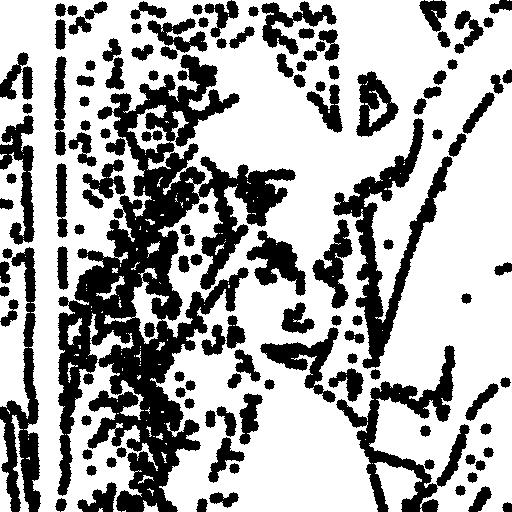

Final Image - Accumulated Center Points Visualization
Number of unique center points: 1881


In [ ]:
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "lena.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为3
    max_iterations = 10
    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, image, max_iterations)

    # Create a blank image to accumulate all center points
    final_center_points_image = np.zeros_like(image, dtype=np.uint8)

    # Create a set to store unique center points
    unique_center_points = set()

    # Record and accumulate the center points from each iteration
    for i, center_points in enumerate(center_points_list):
        for cX, cY in center_points:
            if cX != -1 and cY != -1 and (cX, cY) not in unique_center_points:
                unique_center_points.add((cX, cY))
                cv2.circle(final_center_points_image, (cX, cY), 5, 255, -1)  # Draw a white circle at the center point

    # Invert the colors of the center points visualization
    final_center_points_image = cv2.bitwise_not(final_center_points_image)

    # Calculate the number of unique center points
    num_center_points = len(unique_center_points)

    # Display the final accumulated center points visualization
    cv2_imshow(final_center_points_image)
    print("Final Image - Accumulated Center Points Visualization")
    print(f"Number of unique center points: {num_center_points}")

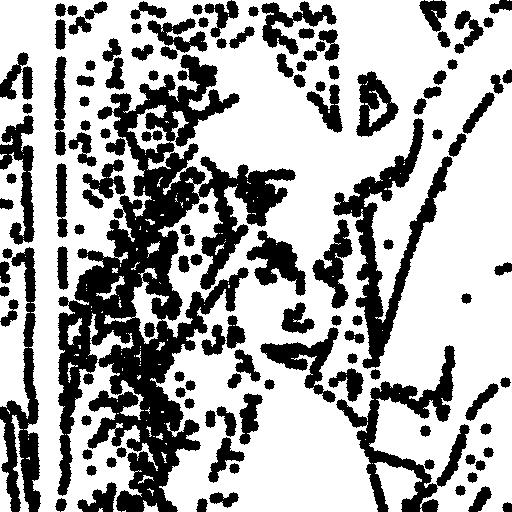

Final Image - Accumulated Center Points Visualization
Total number of center points (including duplicates): 2636


In [ ]:
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "lena.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为3
    max_iterations = 8
    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, image, max_iterations)

    # Create a blank image to accumulate all center points
    final_center_points_image = np.zeros_like(image, dtype=np.uint8)

    # Create a list to store all center points
    all_center_points = []

    # Record and accumulate the center points from each iteration
    for i, center_points in enumerate(center_points_list):
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                all_center_points.append((cX, cY))
                cv2.circle(final_center_points_image, (cX, cY), 5, 255, -1)  # Draw a white circle at the center point

    # Invert the colors of the center points visualization
    final_center_points_image = cv2.bitwise_not(final_center_points_image)

    # Calculate the total number of center points (including duplicates)
    num_center_points = len(all_center_points)

    # Display the final accumulated center points visualization
    cv2_imshow(final_center_points_image)
    print("Final Image - Accumulated Center Points Visualization")
    print(f"Total number of center points (including duplicates): {num_center_points}")


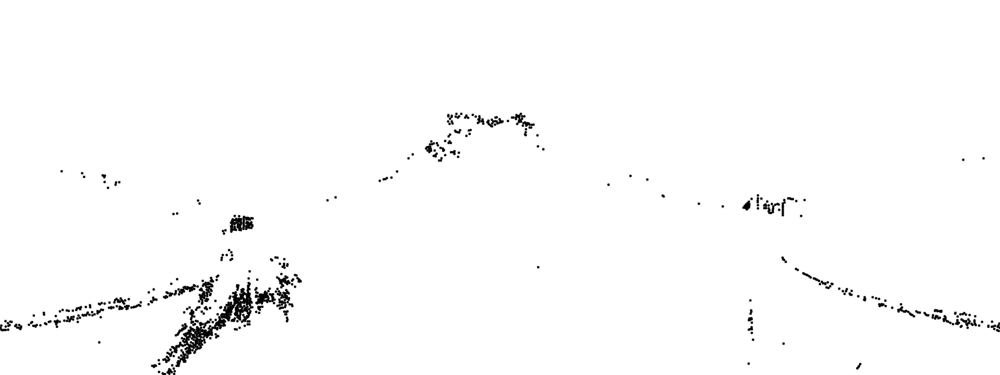

Iteration 1 - Center Points Visualization
Number of center points: 3142


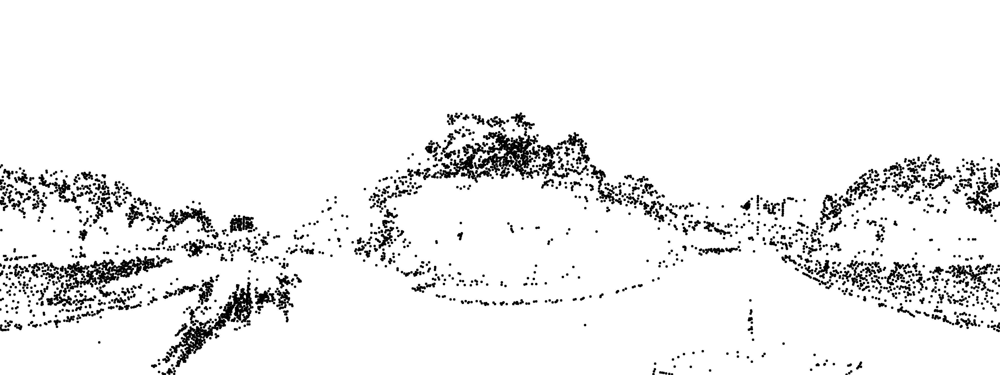

Iteration 2 - Center Points Visualization
Number of center points: 14296


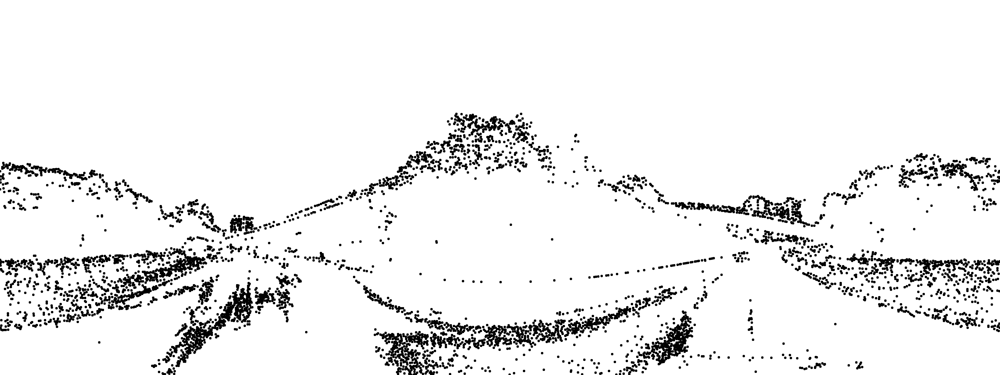

Iteration 3 - Center Points Visualization
Number of center points: 24487


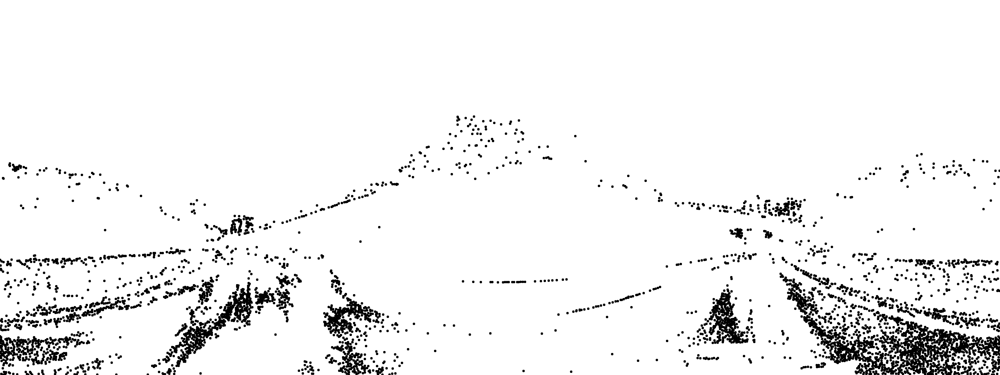

Iteration 4 - Center Points Visualization
Number of center points: 23557


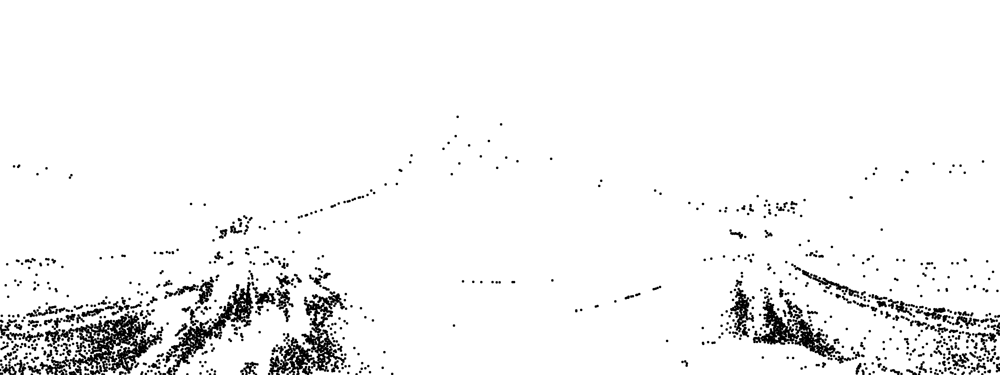

Iteration 5 - Center Points Visualization
Number of center points: 21126


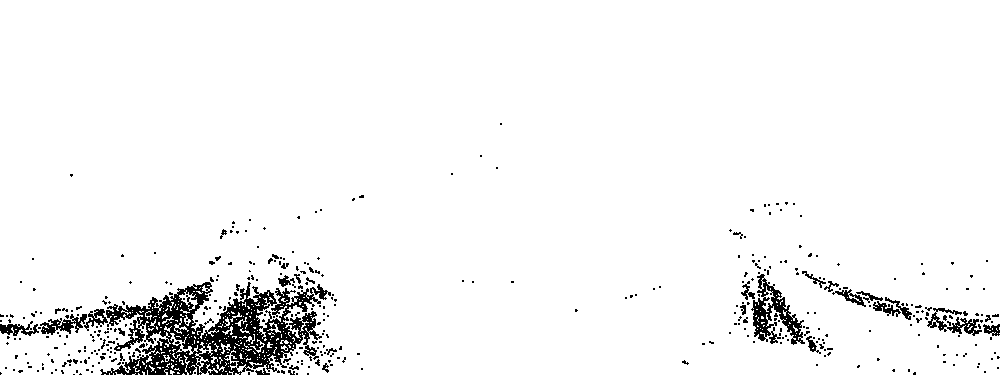

Iteration 6 - Center Points Visualization
Number of center points: 21605


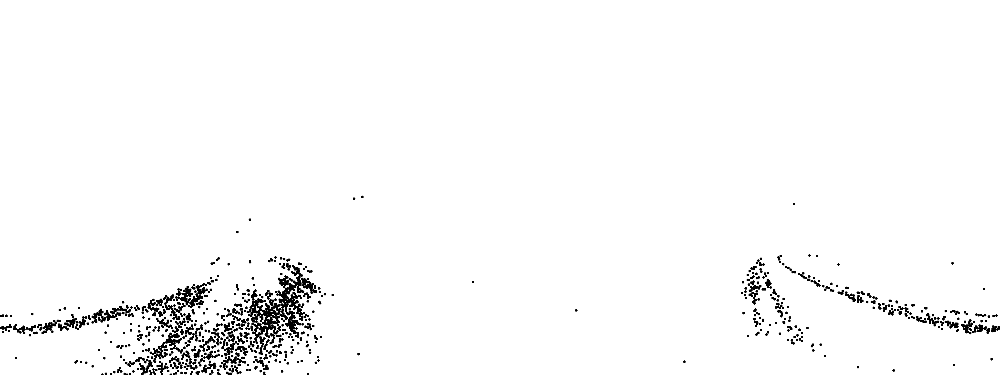

Iteration 7 - Center Points Visualization
Number of center points: 20245


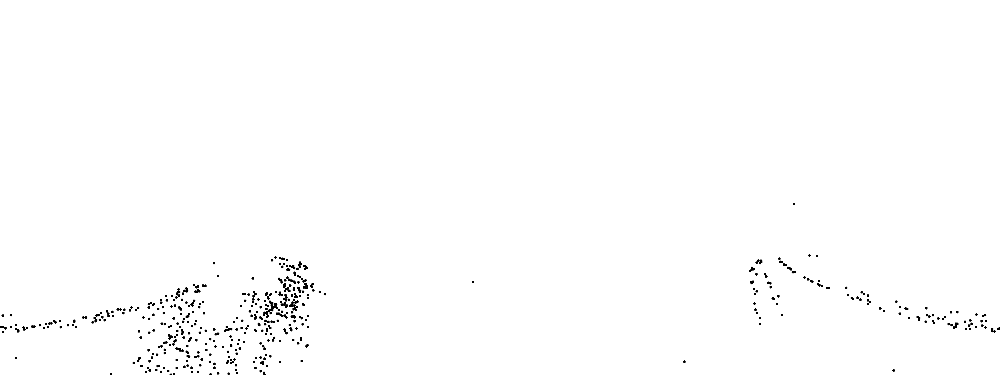

Iteration 8 - Center Points Visualization
Number of center points: 14458


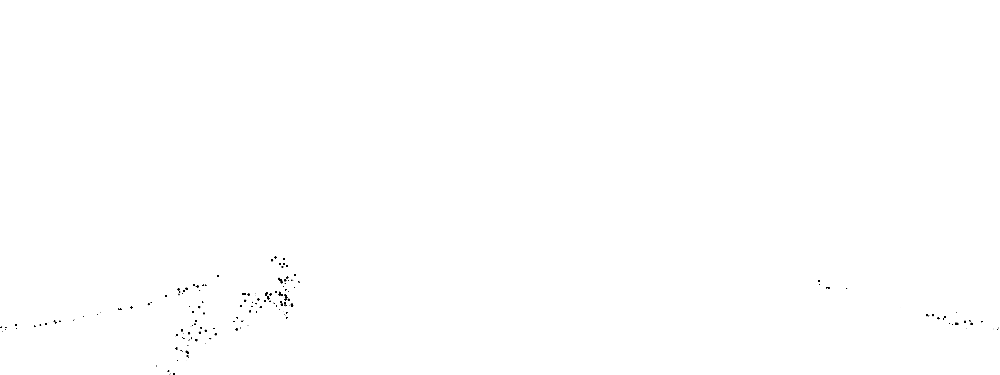

In [ ]:
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "2.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为10
    max_iterations = 8
    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, image, max_iterations)

    # Create a blank image to display all center points together
    all_center_points_image = np.zeros_like(image, dtype=np.uint8)

    # 打印中心点可视化图像和中心点数量
    for i, center_points in enumerate(center_points_list):
        center_points_image = np.zeros_like(image, dtype=np.uint8)
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                cv2.circle(center_points_image, (cX, cY), 5, 255, -1)  # Draw a white circle at the center point

        # Invert the colors of the center points visualization
        center_points_image = cv2.bitwise_not(center_points_image)

        # Count the number of center points
        num_center_points = len(center_points)

        # Display the center points visualization
        cv2_imshow(center_points_image)
        print(f"Iteration {i + 1} - Center Points Visualization")
        print(f"Number of center points: {num_center_points}")

        # Add the current center points visualization to the all_center_points_image
        all_center_points_image = cv2.add(all_center_points_image, center_points_image)

    # Display the final image with all center points
    cv2_imshow(all_center_points_image)


In [ ]:
# 主程序
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "1.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为3
    max_iterations = 10

    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, processed_images[0], max_iterations)

    # 打印每次迭代得到的子结构的二值化图像和中心点
    for i, processed_image in enumerate(processed_images[1:]):  # Start from index 1 to exclude the original image
        # 第一次二值化处理
        _, binary_image = cv2.threshold(processed_image, 0, 255, cv2.THRESH_BINARY)

        # Create a new visualization image for center points
        visualization_image = np.zeros_like(image, dtype=np.uint8)

        # Get the center points for this iteration
        center_points = center_points_list[i]

        # 在可视化图像上绘制中心点
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                cv2.circle(visualization_image, (cX, cY), 5, 255, -1)

        # Create a horizontal stack of binary image and center points visualization
        combined_horizontal = np.hstack((binary_image, visualization_image))

        # 打印每次迭代的二值化图像和中心点可视化图像（横向排列）
        cv2_imshow(combined_horizontal)
        print(f"Iteration {i + 1} - Binary Image (First Threshold) and Center Points Visualization")

    # 打印原始图像
    cv2_imshow(image)
    print("Original Image")


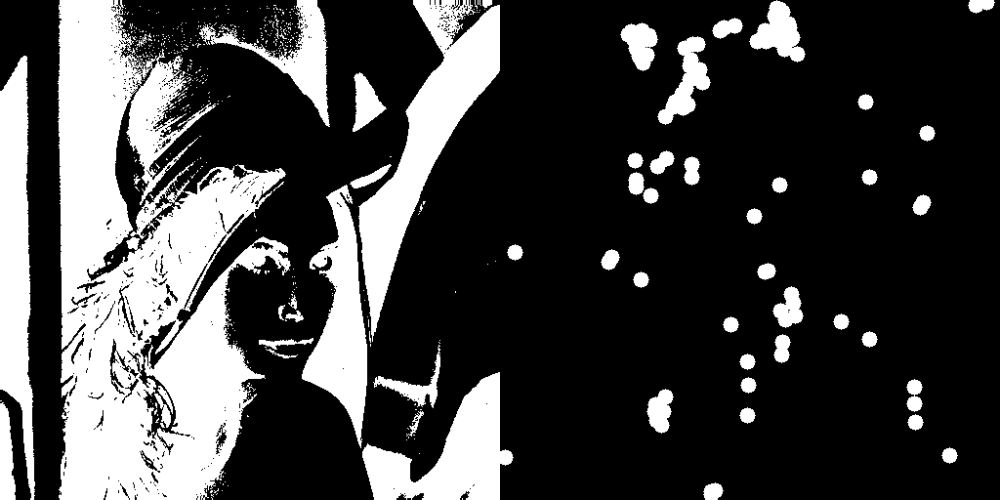

Iteration 1 - Binary Image (First Threshold) and Center Points Visualization


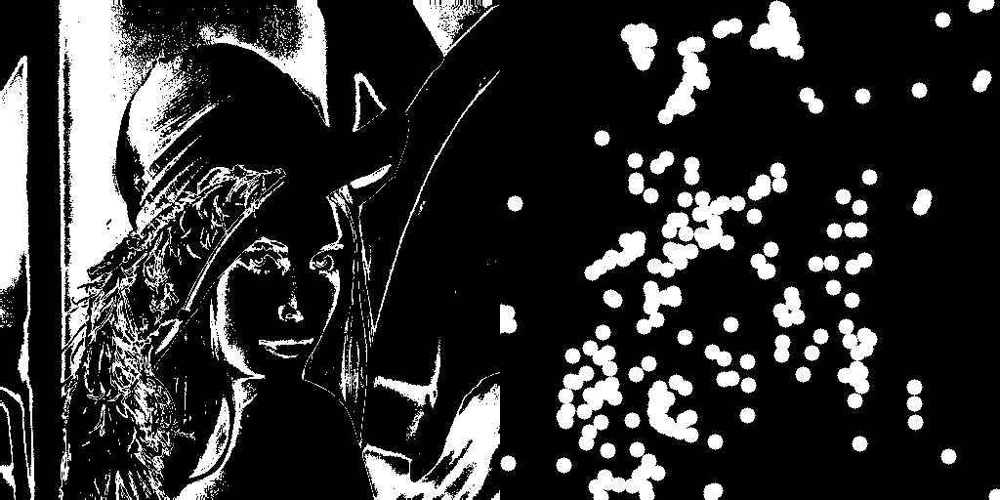

Iteration 2 - Binary Image (First Threshold) and Center Points Visualization


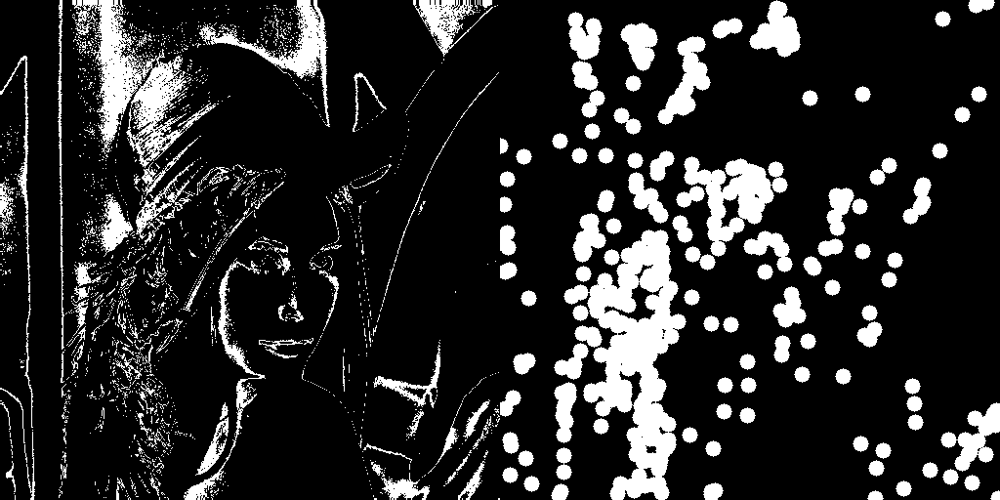

Iteration 3 - Binary Image (First Threshold) and Center Points Visualization


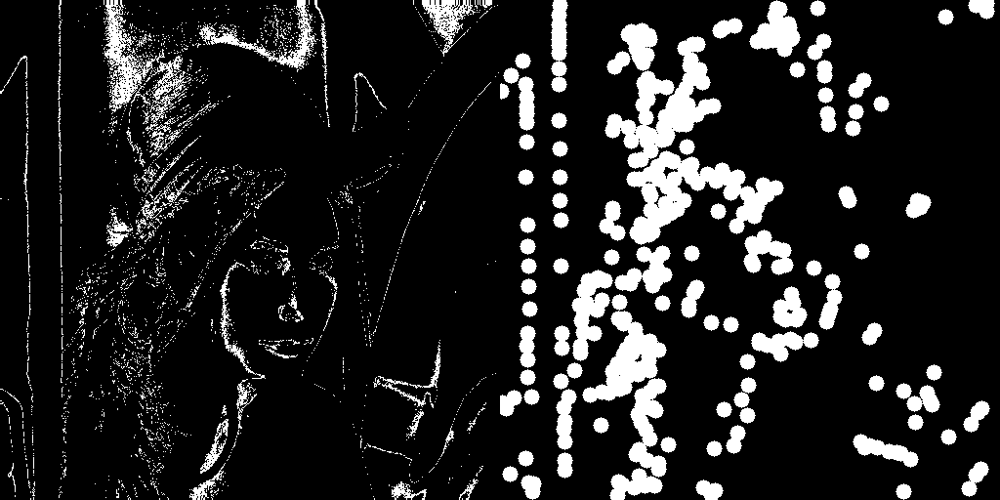

Iteration 4 - Binary Image (First Threshold) and Center Points Visualization


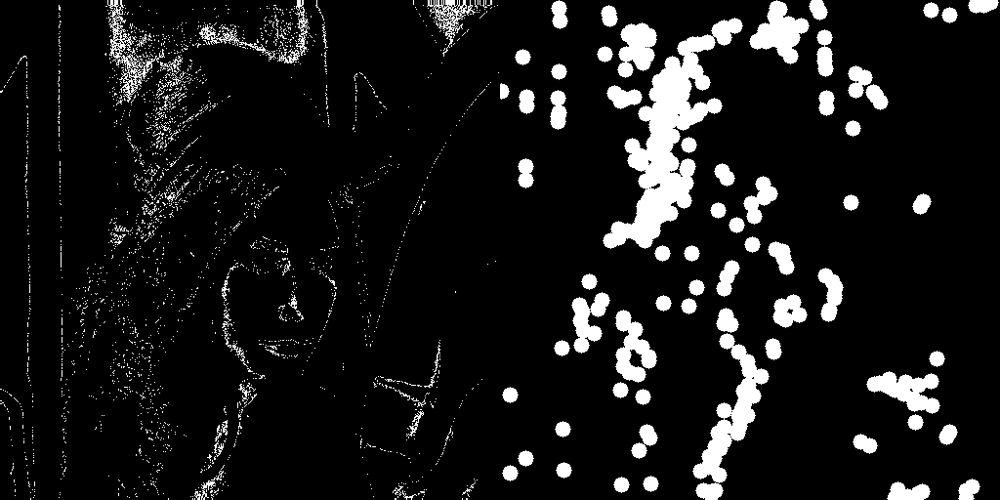

Iteration 5 - Binary Image (First Threshold) and Center Points Visualization


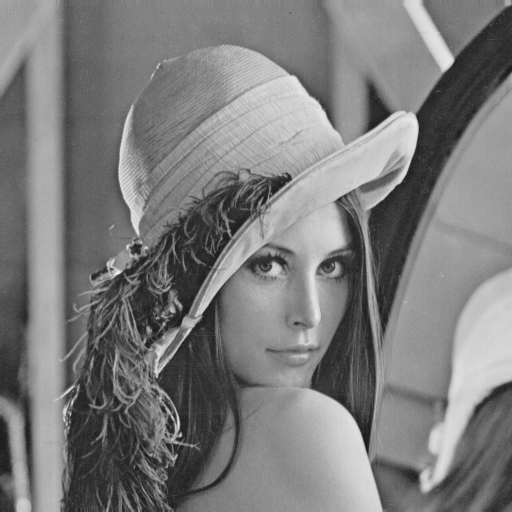

Original Image


In [ ]:
# 主程序
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "lena.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为3
    max_iterations = 5

    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, processed_images[0], max_iterations)

    # 打印每次迭代得到的子结构的二值化图像和中心点
    for i, processed_image in enumerate(processed_images[1:]):  # Start from index 1 to exclude the original image
        # 第一次二值化处理
        _, binary_image = cv2.threshold(processed_image, 0, 255, cv2.THRESH_BINARY)

        # Create a new visualization image for center points
        visualization_image = np.zeros_like(image, dtype=np.uint8)

        # Get the center points for this iteration
        center_points = center_points_list[i]

        # 在可视化图像上绘制中心点
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                # Draw a smaller circle for center points
                cv2.circle(visualization_image, (cX, cY), 8, 255, -1)

        # Create a horizontal stack of binary image and center points visualization
        combined_horizontal = np.hstack((binary_image, visualization_image))

        # 打印每次迭代的二值化图像和中心点可视化图像（横向排列）
        cv2_imshow(combined_horizontal)
        print(f"Iteration {i + 1} - Binary Image (First Threshold) and Center Points Visualization")

    # 打印原始图像
    cv2_imshow(image)
    print("Original Image")


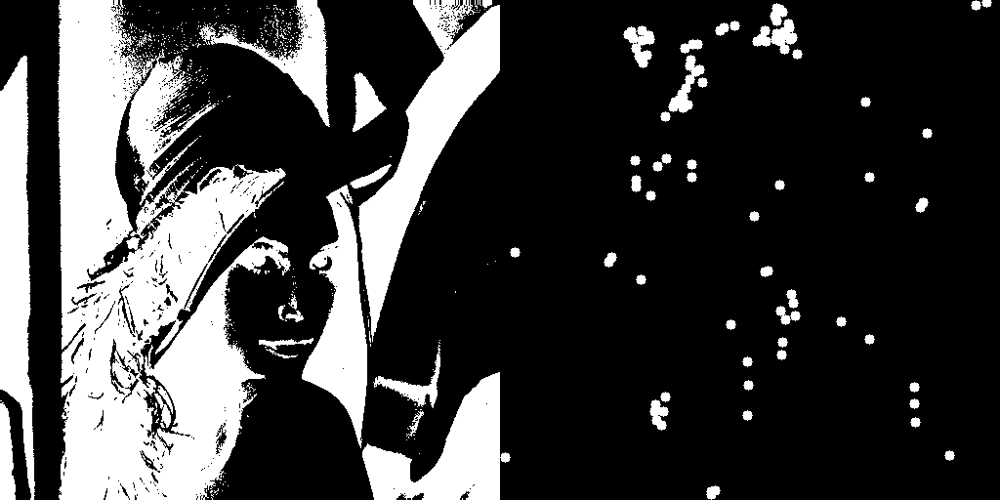

Iteration 1 - Binary Image (First Threshold) and Center Points Visualization


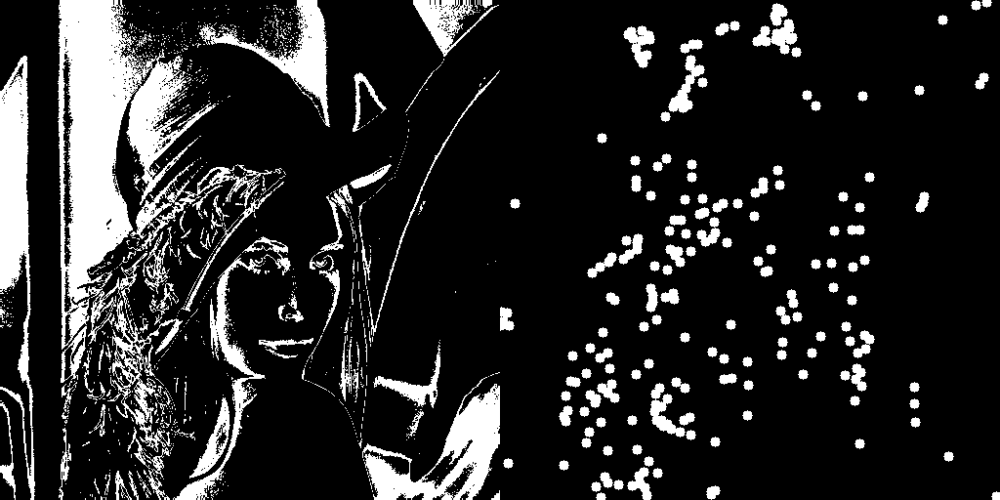

Iteration 2 - Binary Image (First Threshold) and Center Points Visualization


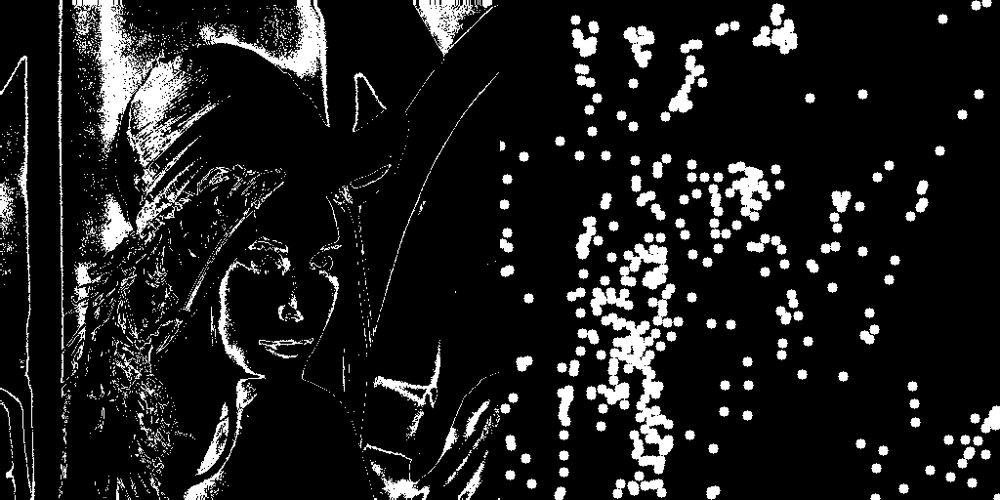

Iteration 3 - Binary Image (First Threshold) and Center Points Visualization


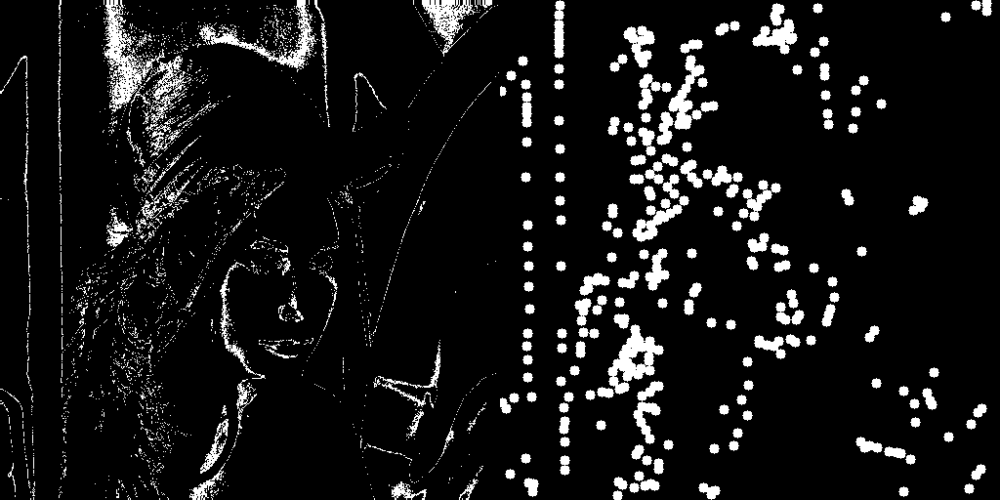

Iteration 4 - Binary Image (First Threshold) and Center Points Visualization


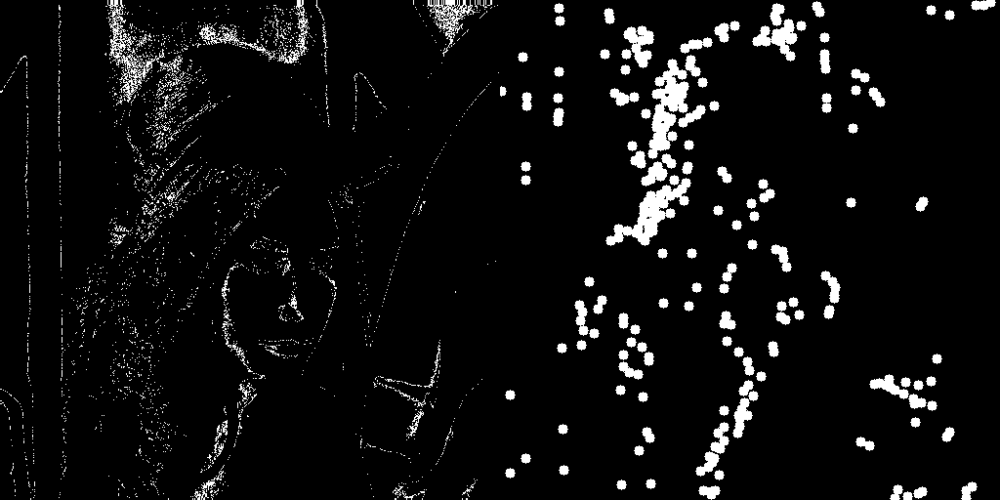

Iteration 5 - Binary Image (First Threshold) and Center Points Visualization


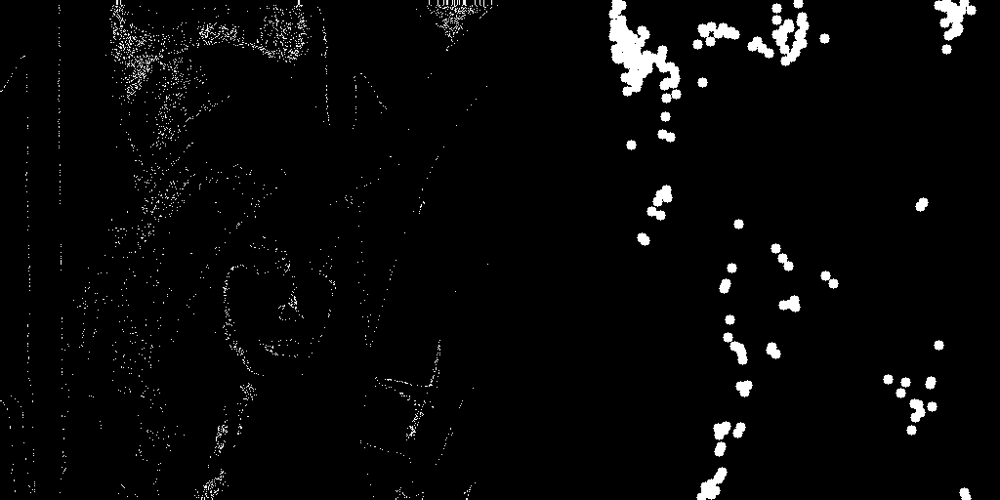

Iteration 6 - Binary Image (First Threshold) and Center Points Visualization


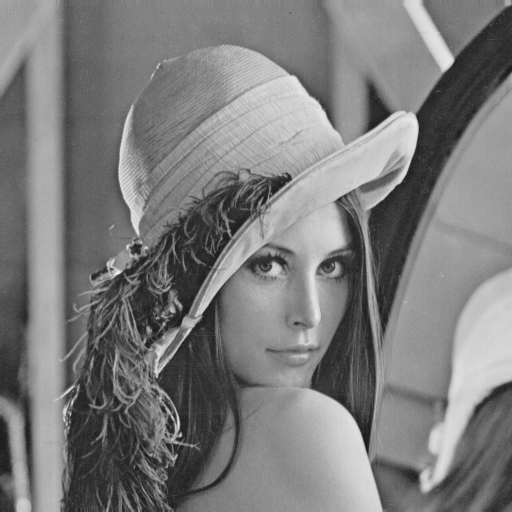

Original Image


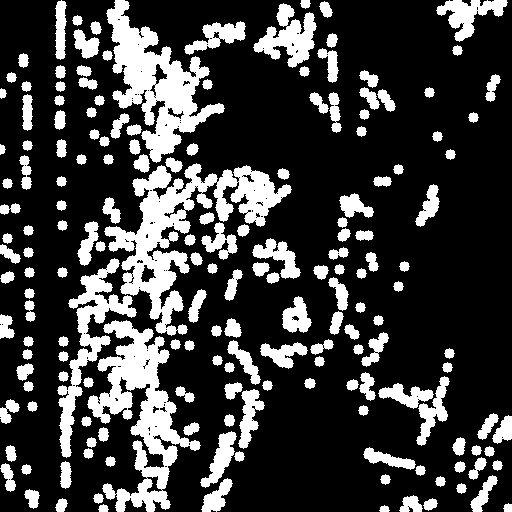

All Center Points Visualization


In [ ]:
# 主程序
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "lena.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为3
    max_iterations = 6

    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, processed_images[0], max_iterations)

    # 创建一张新的图像，用于可视化所有中心点
    all_center_points_visualization = np.zeros_like(image, dtype=np.uint8)

    # 打印每次迭代得到的子结构的二值化图像和中心点，并在all_center_points_visualization上绘制所有中心点
    for i, processed_image in enumerate(processed_images[1:]):  # Start from index 1 to exclude the original image
        # 第一次二值化处理
        _, binary_image = cv2.threshold(processed_image, 0, 255, cv2.THRESH_BINARY)

        # Create a new visualization image for center points
        visualization_image = np.zeros_like(image, dtype=np.uint8)

        # Get the center points for this iteration
        center_points = center_points_list[i]

        # 在可视化图像上绘制中心点
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                # Draw a smaller circle for center points
                cv2.circle(visualization_image, (cX, cY), 5, 255, -1)
                # Also draw the center points on the all_center_points_visualization image
                cv2.circle(all_center_points_visualization, (cX, cY), 5, 255, -1)

        # Create a horizontal stack of binary image and center points visualization
        combined_horizontal = np.hstack((binary_image, visualization_image))

        # 打印每次迭代的二值化图像和中心点可视化图像（横向排列）
        cv2_imshow(combined_horizontal)
        print(f"Iteration {i + 1} - Binary Image (First Threshold) and Center Points Visualization")

    # 打印原始图像
    cv2_imshow(image)
    print("Original Image")

    # 打印所有中心点的可视化图像
    cv2_imshow(all_center_points_visualization)
    print("All Center Points Visualization")


In [ ]:
import random
def generate_random_color():
    return (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))


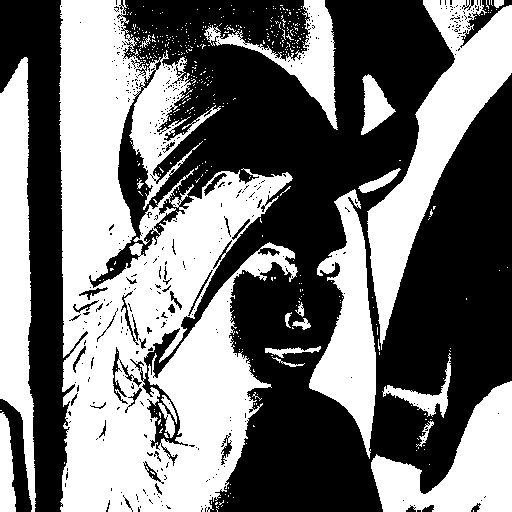

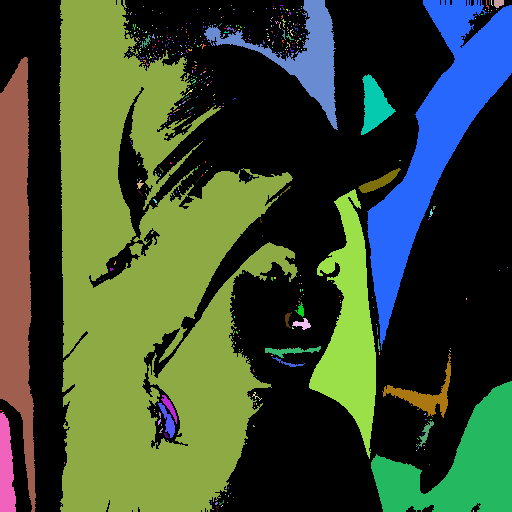

Iteration 1 - Binary Image (First Threshold) and Substructures Visualization


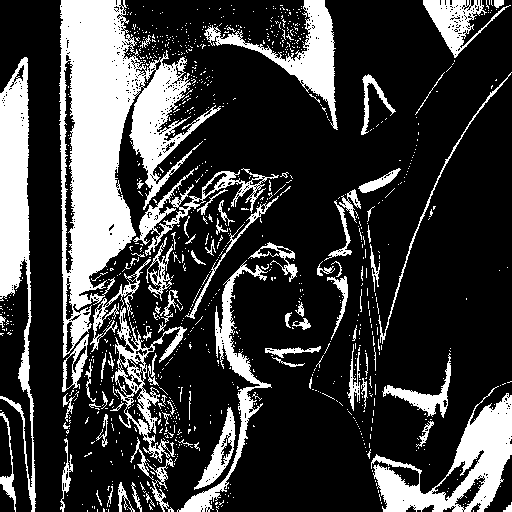

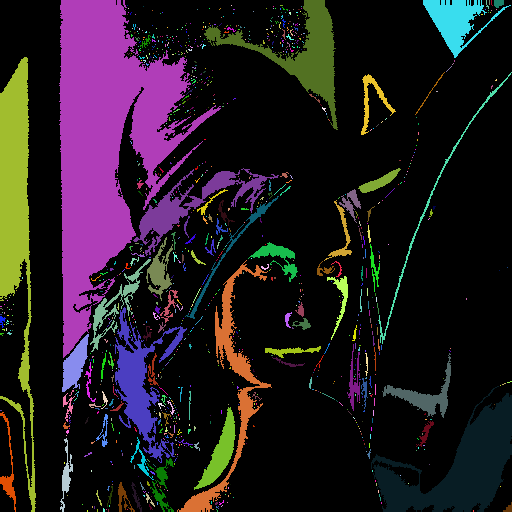

Iteration 2 - Binary Image (First Threshold) and Substructures Visualization


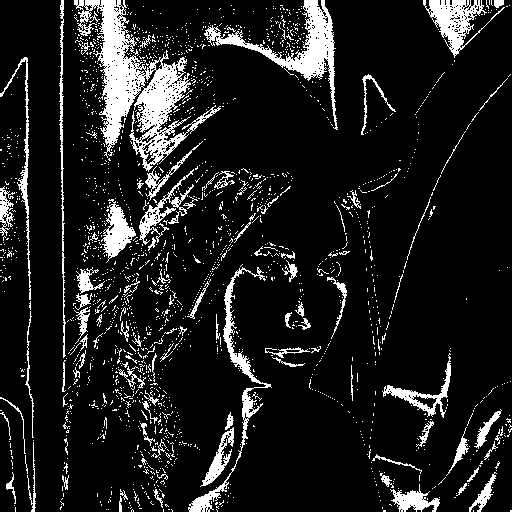

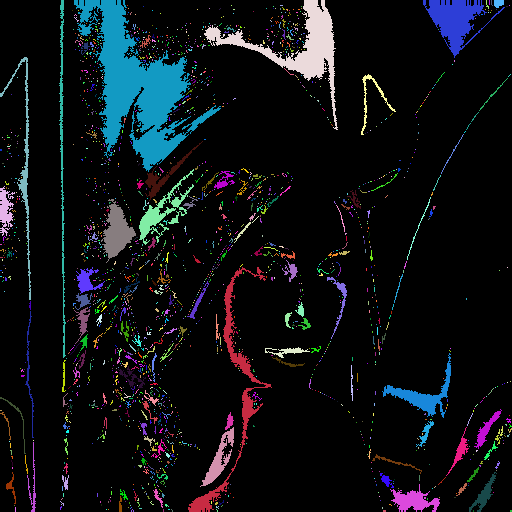

Iteration 3 - Binary Image (First Threshold) and Substructures Visualization


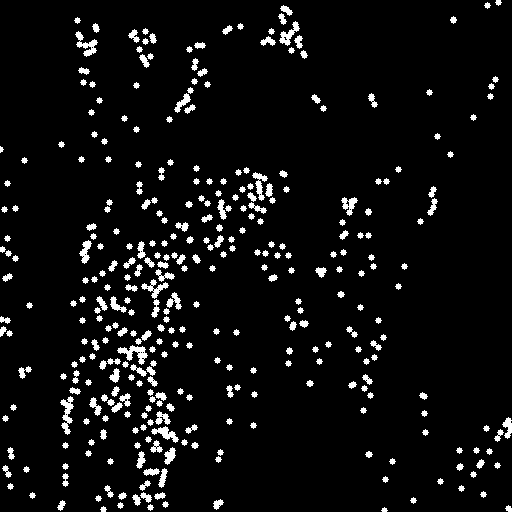

All Center Points Visualization


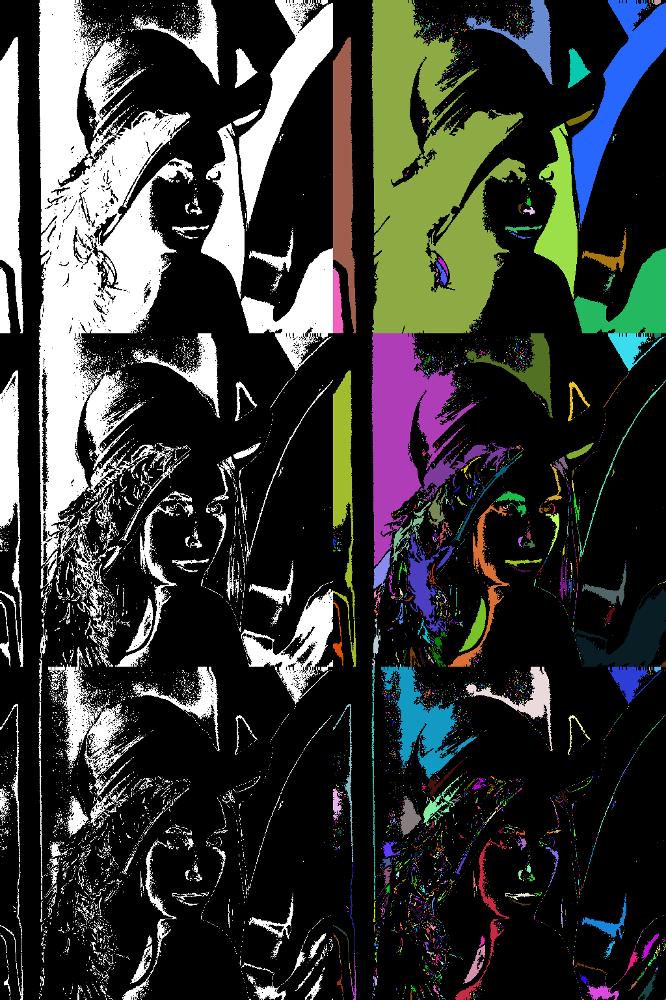

In [ ]:
# 主程序
if __name__ == "__main__":
    # ... (previous code remains the same) ...

 # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, processed_images[0], max_iterations)

    # 打印每次迭代得到的子结构的二值化图像和中心点，并在all_center_points_visualization上绘制所有中心点
    all_center_points_visualization = np.zeros_like(image, dtype=np.uint8)

    # List to store the images from each iteration
    iteration_images = []

    # 打印每次迭代得到的子结构的二值化图像和中心点，并在all_center_points_visualization上绘制所有中心点
    for i, processed_image in enumerate(processed_images[1:]):  # Start from index 1 to exclude the original image
        # 第一次二值化处理
        _, binary_image = cv2.threshold(processed_image, 0, 255, cv2.THRESH_BINARY)

        # Create a new visualization image for center points and substructures
        visualization_image = np.zeros((*processed_image.shape, 3), dtype=np.uint8)  # Colored version

        # Get the center points for this iteration
        center_points = center_points_list[i]

        # 在all_center_points_visualization上绘制所有中心点
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                # Draw a smaller circle for center points
                cv2.circle(all_center_points_visualization, (cX, cY), 3, (255, 255, 255), -1)  # White color for center points

        # 矢量化子结构
        substructures = vectorize_substructure(binary_image)

        # 随机赋颜色给每个子结构并在可视化图像上绘制
        for idx, contour in enumerate(substructures):
            color = generate_random_color()
            cv2.drawContours(visualization_image, [contour], -1, color, -1)

        # Convert binary_image to 3D to match the dimensions of visualization_image
        binary_image_3d = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)

        # Append the images from each iteration to the list
        iteration_images.append(np.hstack((binary_image_3d, visualization_image)))

        # 打印每次迭代的二值化图像和子结构可视化图像
        cv2_imshow(binary_image_3d)
        cv2_imshow(visualization_image)
        print(f"Iteration {i + 1} - Binary Image (First Threshold) and Substructures Visualization")

    # 纵向展示不同迭代次数的图像
    cv2_imshow(all_center_points_visualization)
    print("All Center Points Visualization")
    final_image = np.vstack(iteration_images)
    cv2_imshow(final_image)

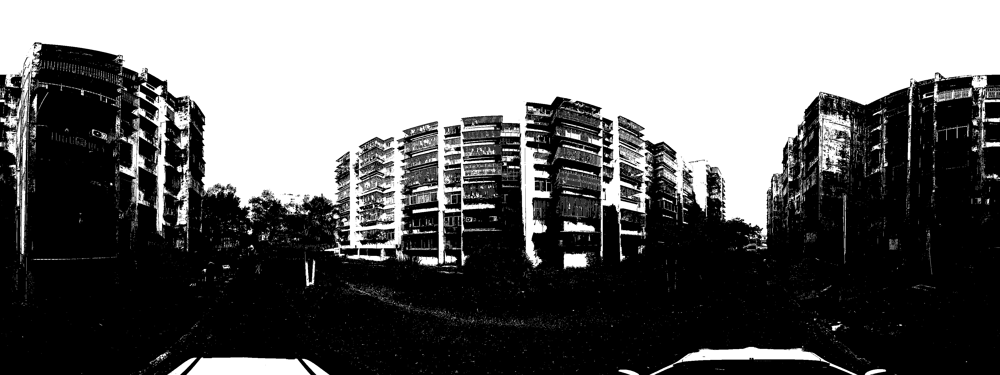

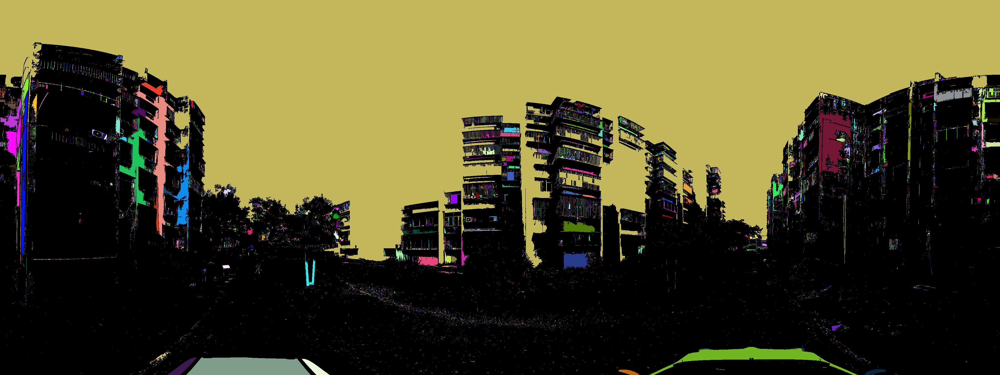

Iteration 1 - Binary Image (First Threshold) and Substructures Visualization


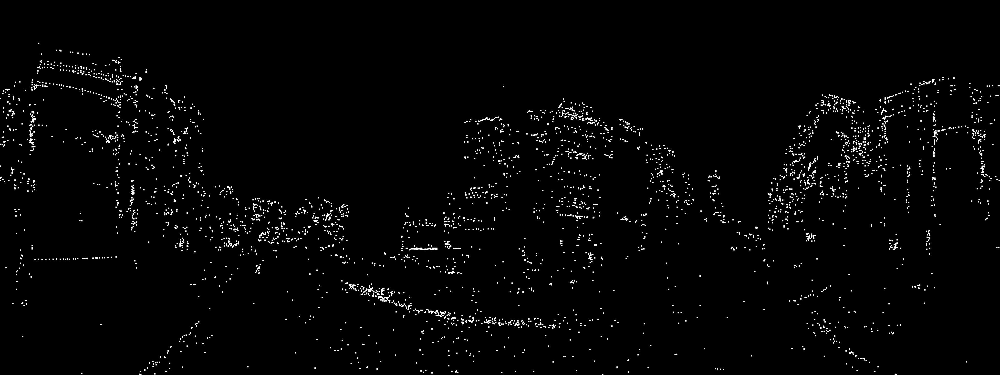

All Center Points Visualization


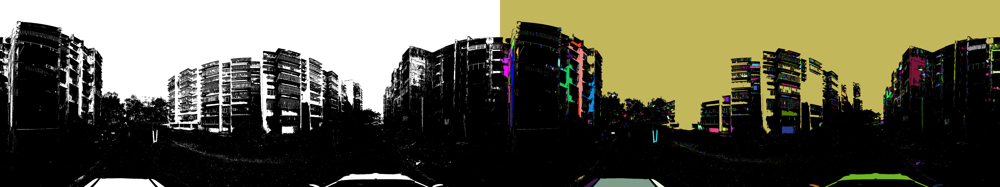

In [ ]:
# 主程序
if __name__ == "__main__":
    # 读取灰度图像
    image_path = "1.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为3
    max_iterations = 1

    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, processed_images[0], max_iterations)

    # 创建一张新的图像，用于可视化所有中心点
    all_center_points_visualization = np.zeros_like(image, dtype=np.uint8)


 # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, processed_images[0], max_iterations)

    # 打印每次迭代得到的子结构的二值化图像和中心点，并在all_center_points_visualization上绘制所有中心点
    all_center_points_visualization = np.zeros_like(image, dtype=np.uint8)

    # List to store the images from each iteration
    iteration_images = []

    # 打印每次迭代得到的子结构的二值化图像和中心点，并在all_center_points_visualization上绘制所有中心点
    for i, processed_image in enumerate(processed_images[1:]):  # Start from index 1 to exclude the original image
        # 第一次二值化处理
        _, binary_image = cv2.threshold(processed_image, 0, 255, cv2.THRESH_BINARY)

        # Create a new visualization image for center points and substructures
        visualization_image = np.zeros((*processed_image.shape, 3), dtype=np.uint8)  # Colored version

        # Get the center points for this iteration
        center_points = center_points_list[i]

        # 在all_center_points_visualization上绘制所有中心点
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                # Draw a smaller circle for center points
                cv2.circle(all_center_points_visualization, (cX, cY), 3, (255, 255, 255), -1)  # White color for center points

        # 矢量化子结构
        substructures = vectorize_substructure(binary_image)

        # 随机赋颜色给每个子结构并在可视化图像上绘制
        for idx, contour in enumerate(substructures):
            color = generate_random_color()
            cv2.drawContours(visualization_image, [contour], -1, color, -1)

        # Convert binary_image to 3D to match the dimensions of visualization_image
        binary_image_3d = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)

        # Append the images from each iteration to the list
        iteration_images.append(np.hstack((binary_image_3d, visualization_image)))

        # 打印每次迭代的二值化图像和子结构可视化图像
        cv2_imshow(binary_image_3d)
        cv2_imshow(visualization_image)
        print(f"Iteration {i + 1} - Binary Image (First Threshold) and Substructures Visualization")

    # 纵向展示不同迭代次数的图像
    cv2_imshow(all_center_points_visualization)
    print("All Center Points Visualization")
    final_image = np.vstack(iteration_images)
    cv2_imshow(final_image)

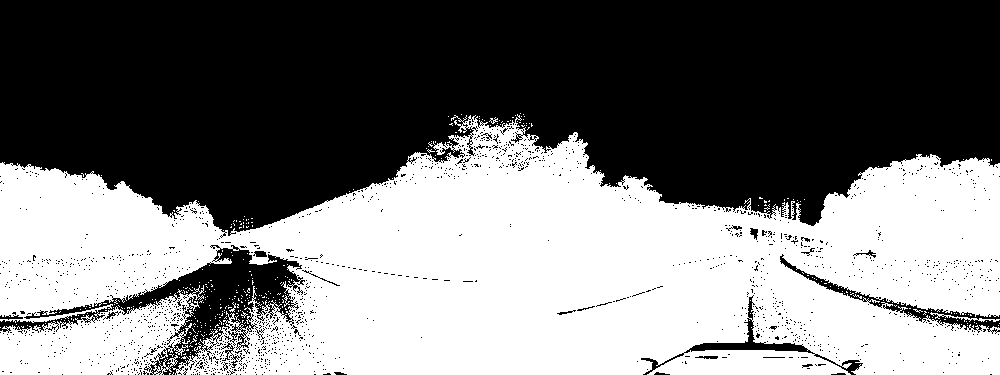

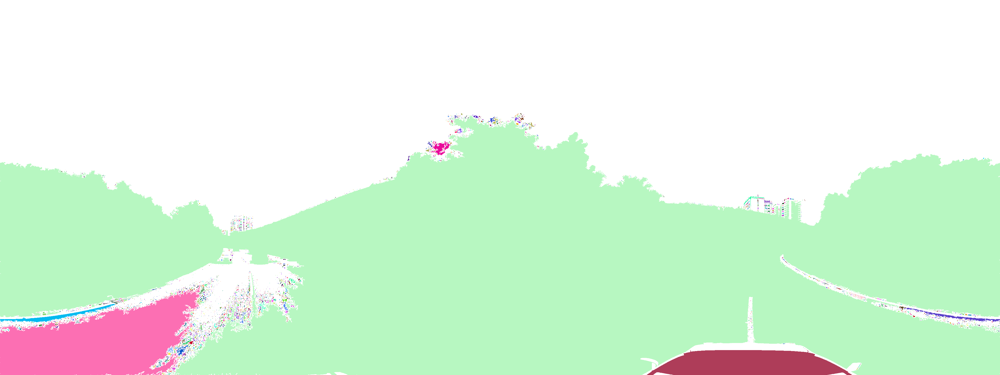

Iteration 1 - Binary Image (First Threshold) and Substructures Visualization


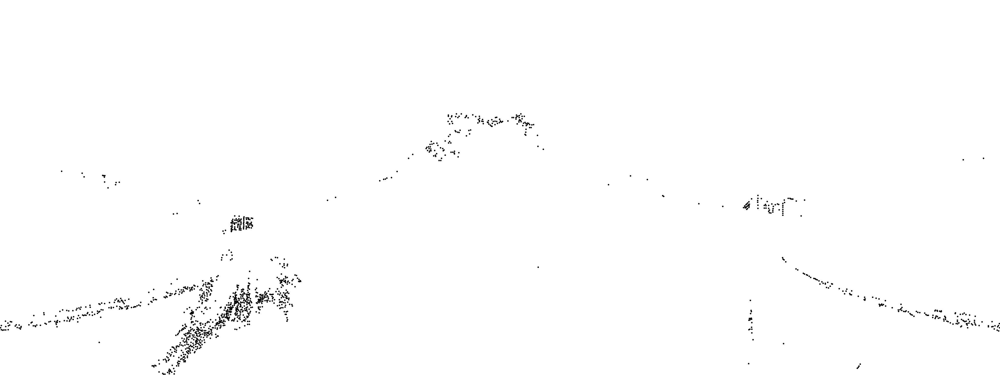

All Center Points Visualization


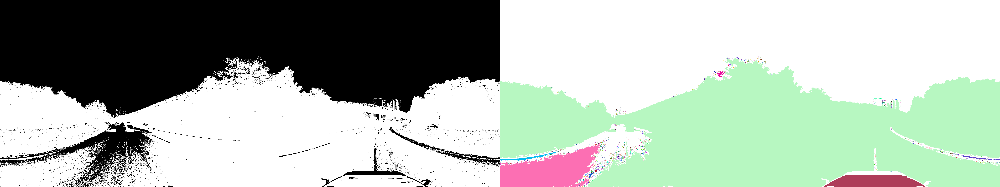

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# ... (previous functions remain the same) ...

if __name__ == "__main__":
    # 读取灰度图像
    image_path = "2.jpg"
    image = read_grayscale_image(image_path)

    # 设置最大递归次数为1
    max_iterations = 1

    # 迭代递归处理图像
    processed_images, center_points_list = recursive_image_processing(image, image, max_iterations)

    # 创建一张新的图像，用于可视化所有中心点
    all_center_points_visualization = np.zeros_like(image, dtype=np.uint8)

    # List to store the images from each iteration
    iteration_images = []

    # 打印每次迭代得到的子结构的二值化图像和中心点，并在all_center_points_visualization上绘制所有中心点
    for i, processed_image in enumerate(processed_images[1:]):  # Start from index 1 to exclude the original image
        # 第一次二值化处理
        _, binary_image = cv2.threshold(processed_image, 0, 255, cv2.THRESH_BINARY)

        # Create a new visualization image for center points and substructures
        visualization_image = np.zeros((*processed_image.shape, 3), dtype=np.uint8)  # Colored version

        # Get the center points for this iteration
        center_points = center_points_list[i]

        # 在all_center_points_visualization上绘制所有中心点
        for cX, cY in center_points:
            if cX != -1 and cY != -1:
                # Draw a smaller circle for center points
                cv2.circle(all_center_points_visualization, (cX, cY), 3, (255, 255, 255), -1)  # White color for center points

        # 矢量化子结构
        substructures = vectorize_substructure(binary_image)

        # 随机赋颜色给每个子结构并在可视化图像上绘制
        for idx, contour in enumerate(substructures):
            color = generate_random_color()
            cv2.drawContours(visualization_image, [contour], -1, color, -1)

        # Convert binary_image to 3D to match the dimensions of visualization_image
        binary_image_3d = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)

        # Iterate over the visualization image and replace black pixels with white
        black_pixels = np.all(visualization_image == [0, 0, 0], axis=-1)  # Find black pixels
        visualization_image[black_pixels] = [255, 255, 255]  # Replace black pixels with white

        # Append the images from each iteration to the list
        iteration_images.append(np.hstack((binary_image_3d, visualization_image)))

        # 打印每次迭代的二值化图像和子结构可视化图像
        cv2_imshow(binary_image_3d)
        cv2_imshow(visualization_image)
        print(f"Iteration {i + 1} - Binary Image (First Threshold) and Substructures Visualization")

    # 纵向展示不同迭代次数的图像
    all_center_points_visualization = cv2.bitwise_not(all_center_points_visualization)  # Invert the colors
    cv2_imshow(all_center_points_visualization)
    print("All Center Points Visualization")

    final_image = np.vstack(iteration_images)
    cv2_imshow(final_image)
